### Problem Statement

In [11]:
#import necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



### data processing

In [14]:
#import data set

data = pd.read_csv("species.csv")

In [16]:
#look data set

data.head()

,Unnamed: 0,site,model,Year,Month,Latitude,Longitude,Depth,Region,Coral_cover,...,Pop_per_area_reef_20km,Random,impact,YEAR,HABITAT_CD,REGION,PCT_CORAL,MAX_HARD_RELIEF,no.divers,Diversity_index
0,0,4733520_128U,biomass,2005,August,24.446433,-81.962900,9.800000,FLA KEYS,2.000000,...,0.047128,3786,0.205,2005,ISOL_LR,FLA KEYS,2.000000,0.550322,4,0.877755
1,1,4966028_487U,impact,2005,June,24.461130,-81.840099,8.821212,FLA KEYS,6.181818,...,0.403795,503,0.382,2005,SPGR_HR,FLA KEYS,6.181818,1.886364,4,0.912085
2,2,4981032_102U,biomass,2005,July,24.467250,-81.832367,17.399239,FLA KEYS,7.506345,...,0.392888,3430,NaN,2005,CONT_LR,FLA KEYS,7.506345,0.749873,4,0.882112
3,3,4999782_141U,impact,2005,August,24.468767,-81.822167,9.200000,FLA KEYS,10.000000,...,0.386919,3696,NaN,2005,ISOL_LR,FLA KEYS,10.000000,0.400000,4,0.806049
4,4,5026033_475U,impact,2005,June,24.470206,-81.808148,8.558032,FLA KEYS,2.870486,...,0.383887,4090,NaN,2005,ISOL_LR,FLA KEYS,2.870486,0.289415,4,0.829156


### Data cleaning

In [19]:
#check data shape of data set

data.shape

(3999, 56)

Here we have 3999 rows and 56 columns

In [22]:
#Get an idea about data set statistics

data.describe()

,Unnamed: 0,Year,Latitude,Longitude,Depth,Coral_cover,Reef_complexity,SST,NPP,Wave_exposure,...,Rec_reliance,Commercial_pounds_landed,Pop_per_area_reef_20km,Random,impact,YEAR,PCT_CORAL,MAX_HARD_RELIEF,no.divers,Diversity_index
count,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3292.000000,3292.000000,3999.000000,3999.000000,3999.000000,...,3910.000000,3.998000e+03,3999.000000,3999.000000,2779.000000,3999.000000,3292.000000,3292.000000,3999.000000,3999.000000
mean,1999.000000,2012.886222,25.361813,-80.912910,12.031226,4.549820,1.100154,23.760696,523.320811,7.322459,...,0.424433,6.312866e+05,6.386781,5047.471618,0.400637,2012.886222,4.549820,1.100154,3.115779,0.831469
std,1154.556192,3.629448,0.806724,1.051129,6.942690,5.522744,0.851008,0.552442,163.404174,0.211270,...,2.247541,4.861803e+05,11.092795,2919.598275,0.281552,3.629448,5.522744,0.851008,0.998422,0.114777
min,0.000000,2005.000000,24.431943,-82.986818,1.300482,0.000000,0.075887,22.405206,287.664307,5.213092,...,-0.185000,1.706314e+05,0.000000,1.000000,0.000000,2005.000000,0.000000,0.075887,2.000000,0.000000
25%,999.500000,2011.000000,24.632586,-81.695419,6.351316,1.500000,0.500000,23.608484,365.925385,7.294437,...,-0.185000,2.469954e+05,0.039136,2550.500000,0.174000,2011.000000,1.500000,0.500000,2.000000,0.811582
50%,1999.000000,2013.000000,25.123213,-80.292226,10.171806,2.758143,0.900596,23.929285,533.677063,7.368210,...,-0.185000,3.180504e+05,0.248873,5097.000000,0.382000,2013.000000,2.758143,0.900596,4.000000,0.867035
75%,2998.500000,2016.000000,26.034196,-80.092946,17.148568,5.283544,1.448243,24.200861,632.628479,7.455595,...,0.044000,8.556702e+05,12.681632,7602.000000,0.694000,2016.000000,5.283544,1.448243,4.000000,0.900148
max,3998.000000,2018.000000,27.189445,-79.993800,32.295441,55.000000,10.538338,24.436212,1330.589233,7.597482,...,12.140000,1.511066e+06,55.371104,9997.000000,1.000000,2018.000000,55.000000,10.538338,8.000000,0.956324


In [153]:
#check columns names

data.columns

Index(['Unnamed: 0', 'site', 'model', 'Year', 'Month', 'Latitude', 'Longitude',
       'Depth', 'Region', 'Coral_cover', 'Reef_complexity', 'SST', 'NPP',
       'Wave_exposure', 'Habitat_type_classLV0', 'Habitat_type_classLV2',
       'Coral_area_UFRTM_20km', 'Coral_area_UFRTM_200km', 'Depth_Sbrocco',
       'Deepwater', 'FSA', 'Marina_slips_10km', 'Marina_slips_25km',
       'Marine_reserve', 'Population_20km', 'Population_50km',
       'Recreational_fishermen_50km', 'Tourist_fishing',
       'Artificial_reefs_1km', 'SG_permits_50km', 'SG_charter_permits_25km',
       'Total_gravity_intercept', 'Total_gravity', 'Keys_Divisions', 'FKNMS',
       'DryTortugas', 'BNP', 'CoralECA', 'Nursery_seagrass',
       'Nursery_mangroves', 'connectivity', 'Comm_engagement', 'Comm_reliance',
       'Rec_engagement', 'Rec_reliance', 'Commercial_pounds_landed',
       'Pop_per_area_reef_20km', 'Random', 'impact', 'YEAR', 'HABITAT_CD',
       'REGION', 'PCT_CORAL', 'MAX_HARD_RELIEF', 'no.divers',
      

In [154]:
#check data columns info

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Unnamed: 0                   3999 non-null   int64  
 1   site                         3999 non-null   object 
 2   model                        3999 non-null   object 
 3   Year                         3999 non-null   int64  
 4   Month                        3999 non-null   object 
 5   Latitude                     3999 non-null   float64
 6   Longitude                    3999 non-null   float64
 7   Depth                        3999 non-null   float64
 8   Region                       3999 non-null   object 
 9   Coral_cover                  3292 non-null   float64
 10  Reef_complexity              3292 non-null   float64
 11  SST                          3999 non-null   float64
 12  NPP                          3999 non-null   float64
 13  Wave_exposure     

In [156]:
#Finding the number of int, float and object columns

int_columns = data.select_dtypes(include=['int64']).columns
float_columns = data.select_dtypes(include=['float64']).columns
object_columns = data.select_dtypes(include=['object']).columns

print(f"Number of int columns: {len(int_columns)}")
print(f"Number of float columns: {len(float_columns)}")
print(f"Number of object columns: {len(object_columns)}")



Number of int columns: 15
Number of float columns: 27
Number of object columns: 14


### According to the Domain Knowledge of Fishers diversity index select key Variables

To select the most appropriate variables for predicting the diversity index of fish species, I will focus on variables that are directly or indirectly related to environmental, ecological, and habitat conditions, as well as those related to the species diversity itself. Here's the reasoning:

### Key Variables to Include:

1.Latitude and Longitude:

Reason: Geographic coordinates are essential for location-based variations in species diversity, environmental conditions, and fish habitat availability.

2.Depth:

Reason: Fish diversity is strongly influenced by the depth of the habitat, as species adapt to different depth levels and related environmental factors (e.g., light, pressure).

3.Coral_cover:

Reason: Coral cover is a significant determinant of biodiversity in reef ecosystems. A higher coral cover generally correlates with more diverse species due to the complex habitats it provides.

4.Reef_complexity:

Reason: Structural complexity of reefs provides hiding spots and resources for fish, directly influencing species richness and abundance.

5.SST (Sea Surface Temperature):

Reason: Sea surface temperature affects the metabolic rates and habitat ranges of fish species. It is a critical driver of marine biodiversity and can influence the diversity index.

6.NPP (Net Primary Productivity):

Reason: Higher productivity generally supports a richer food web, which can support a higher diversity of species.

7.Wave_exposure:

Reason: Exposure to waves affects reef health and the species that can thrive in a particular area. It impacts habitat stability, which in turn affects biodiversity.

8.Habitat_type_classLV0:

Reason: Habitat classification at a high level (LV0) helps in understanding the type of ecosystem present at the site, which influences species diversity.

9.Coral_area_UFRTM_20km:

Reason: The area of coral reef within 20 km of the site is relevant for assessing the regional diversity of fish species that can inhabit the coral areas.

10.Marine_reserve:

Reason: Protected areas often have higher biodiversity due to reduced fishing pressure, which allows fish populations to grow and diversify.

11.Nursery_seagrass and Nursery_mangroves:

Reason: Connectivity to seagrass and mangrove nurseries can enhance fish species diversity due to their role as breeding grounds and juvenile habitats for many species.

12.Population_20km or Population_50km:

Reason: Human population density near reefs can indicate the degree of anthropogenic pressure (pollution, overfishing), which impacts the health of marine ecosystems and fish diversity.

13.Region:

Reason: Geographic regions influence ecological conditions and species composition. Including this variable can help capture regional differences in fish diversity.

14.MAX_HARD_RELIEF:

Reason: Hard relief is another indicator of reef complexity. Since complex structures provide more habitats, it's crucial for predicting biodiversity.


15.Coral_area_UFRTM_200km:

Reason: This variable extends the area of coral reef consideration, which could influence regional biodiversity beyond the immediate surroundings. Include this to account for larger-scale ecosystem impacts.

16.Pop_per_area_reef_20km:

Reason: Population pressure on reefs, when normalized by reef area, can affect biodiversity by influencing fishing intensity and pollution. This is a meaningful human impact variable.


### Variables to Exclude:

1.Year, Month, Site, Model, Random,Unnamed: 0:

Reason: These are identifiers or time-based variables that do not directly influence the diversity index. They are used for data organization and model splitting, not prediction.

2.Keys_Divisions, FKNMS, DryTortugas, BNP, CoralECA:

Reason: These are location-specific jurisdictions. Latitude and longitude already cover geographical variation, so these are redundant.

3.Tourist_fishing, SG_permits, SG_charter_permits, Marina_slips:

Reason: While human activity can affect species diversity, these specific metrics are indirect and likely less impactful compared to population density or reserve status.

4.Comm_engagement, Rec_engagement, Comm_reliance, Rec_reliance:

Reason: These variables relate to socio-economic factors, which are useful for fisheries management but are less directly related to predicting ecological diversity.

5.Artificial_reefs_1km:

Reason: Artificial reefs may have local effects, but coral reef area is a more comprehensive measure of natural habitat availability.

6.Deepwater, FSA, Distance to Fish Spawning Aggregations:

Reason: While potentially relevant, the inclusion of reef complexity, coral cover, and depth already provides sufficient environmental context for diversity.

7.Impact, Total_gravity:

Reason: Impact or human pressure is already captured by other more relevant variables like population, marine reserve status, and fishing impact.

8.PCT_CORAL (Percent Coral Cover):

Reason: Similar to Coral_cover

9.Depth_Sbrocco:

Reason: Since Depth is already included, and depth is measured directly in other ways, this remotely sensed depth measure is redundant.

10.Marina_slips_10km and Marina_slips_25km:

Reason: Marina slips might indicate human activity, but Population_20km or Pop_per_area_reef_20km already provides a stronger proxy for human impact, making these variables less necessary.

11.Recreational_fishermen_50km:

Reason: While recreational fishing can influence fish populations, it's less directly related to fish diversity than other human impact variables like Population_20km or Marine_reserve.

12.Total_gravity_intercept:

Reason: This is a more complex socio-economic measure and is indirectly related to the diversity index. Other, more direct measures of human pressure, such as population density, are already included.

13.connectivity:

Reason: This variable is useful in a larval dispersion context but is less directly linked to fish species diversity compared to habitat and environmental variables.

14.Commercial_pounds_landed:

Reason: The amount of fish commercially landed focuses on economic activity rather than ecological diversity. It can be excluded as its impact is indirect.

15.HABITAT_CD:

Reason: This is a code used for site stratification. Since habitat complexity and coral cover are already included in more detailed forms, this variable can be excluded.

16.no.divers:

Reason: The number of divers does not impact fish diversity; it is simply a survey parameter. Therefore, it is unnecessary for predicting diversity.


In [162]:
#Remove unnecessary columns in data set

# List of columns to include
include_columns = [
    'Latitude', 'Longitude', 'Depth', 'Coral_cover', 'Reef_complexity', 'SST', 'NPP', 'Wave_exposure', 
    'Habitat_type_classLV0', 'Coral_area_UFRTM_20km', 'Marine_reserve', 'Nursery_seagrass', 'Nursery_mangroves', 
    'Population_20km','Population_50km','REGION','MAX_HARD_RELIEF','Coral_area_UFRTM_200km','Pop_per_area_reef_20km','Diversity_index'
]

# Keep only the included columns
data = data[include_columns]


In [165]:
#Look at the new data set after the remove unnecessary columns 

data.head()

,Latitude,Longitude,Depth,Coral_cover,Reef_complexity,SST,NPP,Wave_exposure,Habitat_type_classLV0,Coral_area_UFRTM_20km,Marine_reserve,Nursery_seagrass,Nursery_mangroves,Population_20km,Population_50km,REGION,MAX_HARD_RELIEF,Coral_area_UFRTM_200km,Pop_per_area_reef_20km,Diversity_index
0,24.446433,-81.962900,9.800000,2.000000,0.550322,23.595392,550.865051,6.992729,Coral Reef and Hardbottom,88333,Open,6483631.0,199409.31250,4163,41070,FLA KEYS,0.550322,1040643,0.047128,0.877755
1,24.461130,-81.840099,8.821212,6.181818,1.886364,23.578271,577.431946,6.950751,Coral Reef and Hardbottom,91742,Open,11501368.0,21234.26563,37045,43641,FLA KEYS,1.886364,1057990,0.403795,0.912085
2,24.467250,-81.832367,17.399239,7.506345,0.749873,23.551355,595.320252,6.950181,Coral Reef and Hardbottom,94607,Open,12102752.0,13956.82617,37170,44078,FLA KEYS,0.749873,1058988,0.392888,0.882112
3,24.468767,-81.822167,9.200000,10.000000,0.400000,23.556451,590.443543,6.959807,Coral Reef and Hardbottom,96139,Open,11003196.0,14876.60742,37198,44369,FLA KEYS,0.400000,1060134,0.386919,0.806049
4,24.470206,-81.808148,8.558032,2.870486,0.289415,23.567590,579.874023,6.914992,Coral Reef and Hardbottom,98167,Open,9313051.0,14697.00195,37685,45235,FLA KEYS,0.289415,1061388,0.383887,0.829156


In [166]:
#check new data set shape

data.shape

(3999, 20)

In [169]:
#check  how many columns in new data set

print(len(include_columns))

20


In [170]:
#check new data set columns data types

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Latitude                3999 non-null   float64
 1   Longitude               3999 non-null   float64
 2   Depth                   3999 non-null   float64
 3   Coral_cover             3292 non-null   float64
 4   Reef_complexity         3292 non-null   float64
 5   SST                     3999 non-null   float64
 6   NPP                     3999 non-null   float64
 7   Wave_exposure           3999 non-null   float64
 8   Habitat_type_classLV0   3999 non-null   object 
 9   Coral_area_UFRTM_20km   3999 non-null   int64  
 10  Marine_reserve          3999 non-null   object 
 11  Nursery_seagrass        3999 non-null   float64
 12  Nursery_mangroves       3999 non-null   float64
 13  Population_20km         3999 non-null   int64  
 14  Population_50km         3999 non-null   

In [171]:
#Check what are the Discrete,Continuous, and Categorical Columns

discrete_columns = []
continuous_columns = []
categorical_columns = []

for col in data.columns:
    # Check if the column is of integer type
    if pd.api.types.is_integer_dtype(data[col]):
        # Check if the column has a small number of unique values
        if data[col].nunique() < 20:  # Arbitrary threshold for discreteness
            discrete_columns.append(col)
        else:
            continuous_columns.append(col)
    # Check if the column is of float type
    elif pd.api.types.is_float_dtype(data[col]):
        continuous_columns.append(col)
    # Check if the column is of object type (i.e., categorical)
    elif pd.api.types.is_object_dtype(data[col]):
        categorical_columns.append(col)

print("Discrete Columns------>:", discrete_columns)
print(" ")
print("Continuous Columns------>:", continuous_columns)
print(" ")
print("Categorical Columns------>:", categorical_columns)


Discrete Columns------>: []
 
Continuous Columns------>: ['Latitude', 'Longitude', 'Depth', 'Coral_cover', 'Reef_complexity', 'SST', 'NPP', 'Wave_exposure', 'Coral_area_UFRTM_20km', 'Nursery_seagrass', 'Nursery_mangroves', 'Population_20km', 'Population_50km', 'MAX_HARD_RELIEF', 'Coral_area_UFRTM_200km', 'Pop_per_area_reef_20km', 'Diversity_index']
 
Categorical Columns------>: ['Habitat_type_classLV0', 'Marine_reserve', 'REGION']


In [173]:
#check missing  values

null_counts = data.isnull().sum()
null_counts

Latitude                    0
Longitude                   0
Depth                       0
Coral_cover               707
Reef_complexity           707
SST                         0
NPP                         0
Wave_exposure               0
Habitat_type_classLV0       0
Coral_area_UFRTM_20km       0
Marine_reserve              0
Nursery_seagrass            0
Nursery_mangroves           0
Population_20km             0
Population_50km             0
REGION                      0
MAX_HARD_RELIEF           707
Coral_area_UFRTM_200km      0
Pop_per_area_reef_20km      0
Diversity_index             0
dtype: int64

<Axes: >

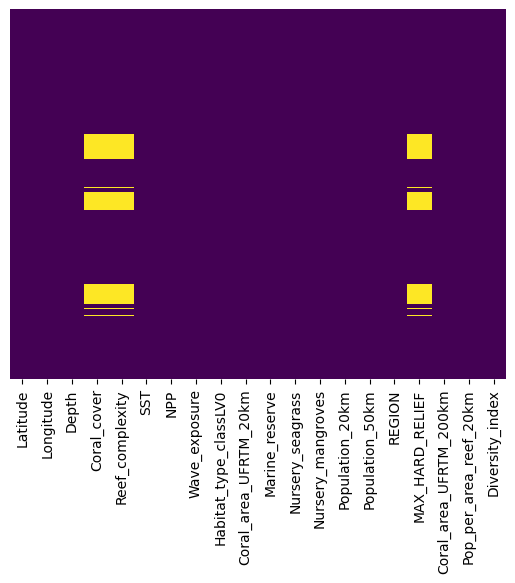

In [174]:
#plot Heatmap for visualizing null values

sns.heatmap(data.isnull(),yticklabels = False,cbar = False,cmap='viridis')

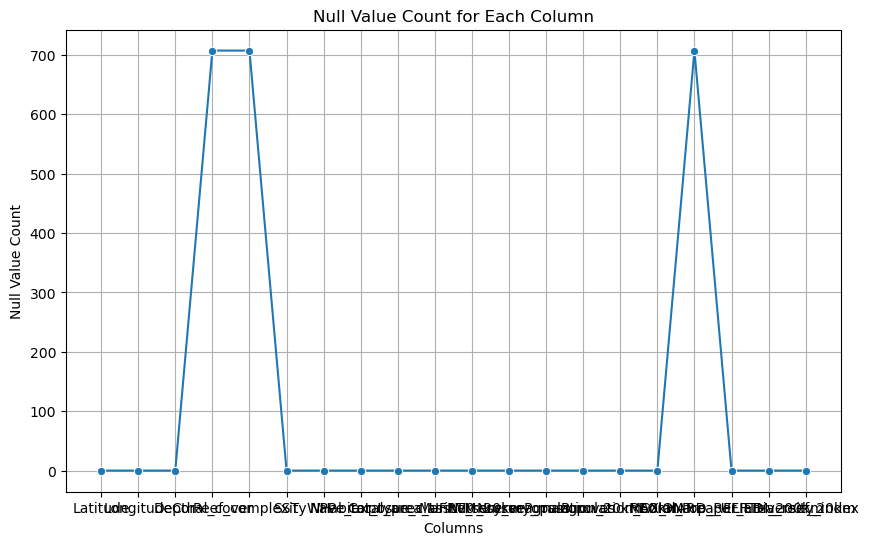

In [177]:
# Plot null values the line chart using Seaborn

plt.figure(figsize=(10, 6))
sns.lineplot(x=null_counts.index, y=null_counts.values, marker='o')
plt.title('Null Value Count for Each Column')
plt.xlabel('Columns')
plt.ylabel('Null Value Count')
plt.grid(True)
plt.show()

In [180]:
# Finding columns with at least one null value

null_columns = data.columns[data.isnull().any()]
print(len(null_columns))
print(null_columns)

3
Index(['Coral_cover', 'Reef_complexity', 'MAX_HARD_RELIEF'], dtype='object')


In this data set we have 3 Columns include null values. Columns are Coral_cover, Reef_complexity, MAX_HARD_RELIEF.Here we use median to fill missing values

In [184]:
#Medion method for handle null values

for i in ['Coral_cover', 'Reef_complexity', 'MAX_HARD_RELIEF']:
    # Convert the column to float64, coercing errors to NaN
    data[i] = pd.to_numeric(data[i], errors='coerce')
    
    # Fill missing values with the median and assign it back to the column
    data[i] = data[i].fillna(data[i].median())

In [185]:
#After filling null values check null values

null_counts = data.isnull().sum()
null_counts 

Latitude                  0
Longitude                 0
Depth                     0
Coral_cover               0
Reef_complexity           0
SST                       0
NPP                       0
Wave_exposure             0
Habitat_type_classLV0     0
Coral_area_UFRTM_20km     0
Marine_reserve            0
Nursery_seagrass          0
Nursery_mangroves         0
Population_20km           0
Population_50km           0
REGION                    0
MAX_HARD_RELIEF           0
Coral_area_UFRTM_200km    0
Pop_per_area_reef_20km    0
Diversity_index           0
dtype: int64

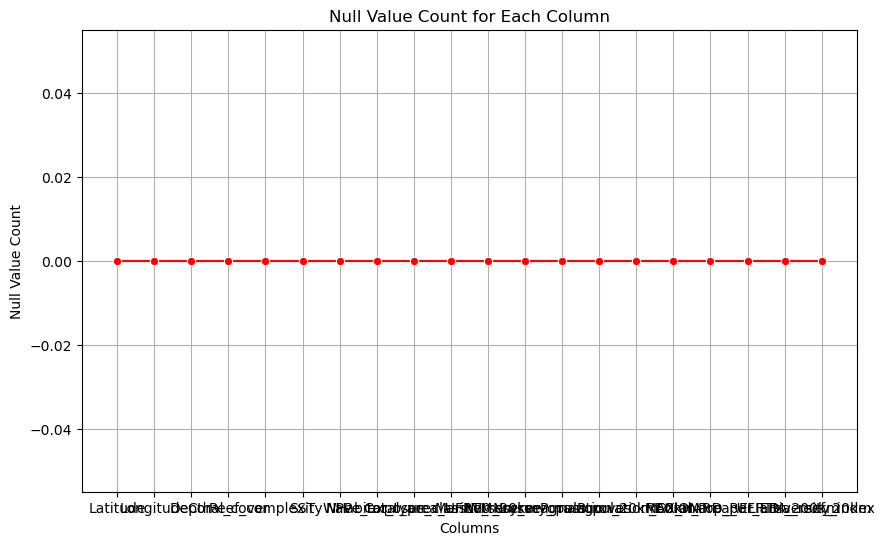

In [186]:
# Plot null values after the handle missing values the line chart using Seaborn

plt.figure(figsize=(10, 6))
sns.lineplot(x=null_counts.index, y=null_counts.values, marker='o',color='red')
plt.title('Null Value Count for Each Column')
plt.xlabel('Columns')
plt.ylabel('Null Value Count')
plt.grid(True)
plt.show()

In [187]:
#check duplicate values
data.duplicated().sum()

0

In [188]:
#Checking the number of unique values of each column

data.nunique()

Latitude                  3984
Longitude                 3969
Depth                     3293
Coral_cover               2415
Reef_complexity           2815
SST                       3428
NPP                       3660
Wave_exposure             3673
Habitat_type_classLV0        3
Coral_area_UFRTM_20km     3253
Marine_reserve               2
Nursery_seagrass          2723
Nursery_mangroves         2973
Population_20km           1051
Population_50km           1039
REGION                       3
MAX_HARD_RELIEF           2815
Coral_area_UFRTM_200km    3608
Pop_per_area_reef_20km    3041
Diversity_index           3990
dtype: int64

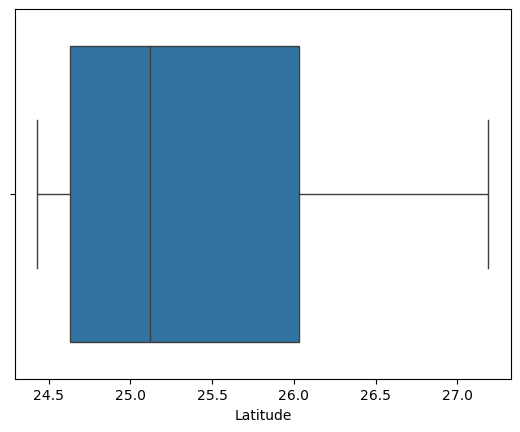

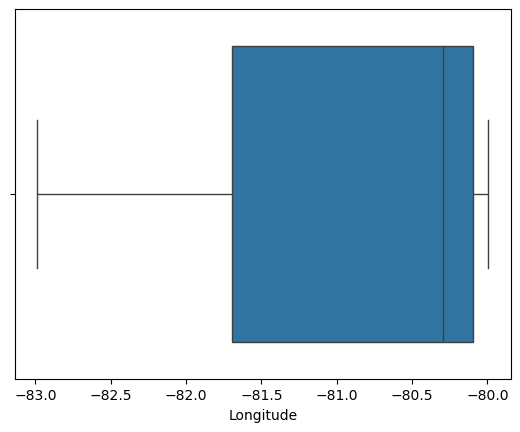

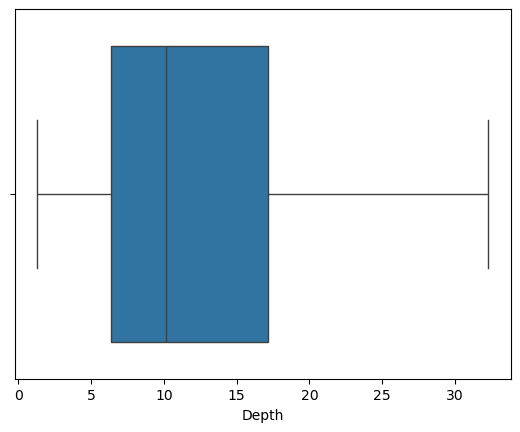

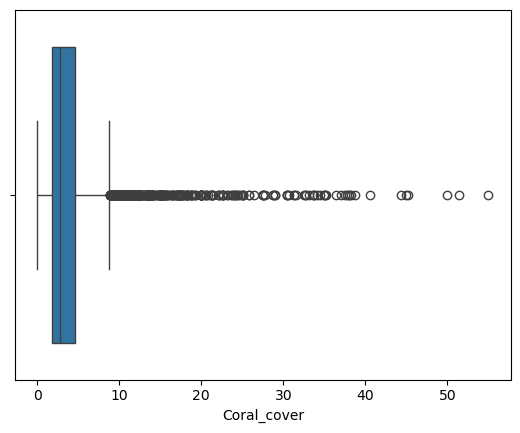

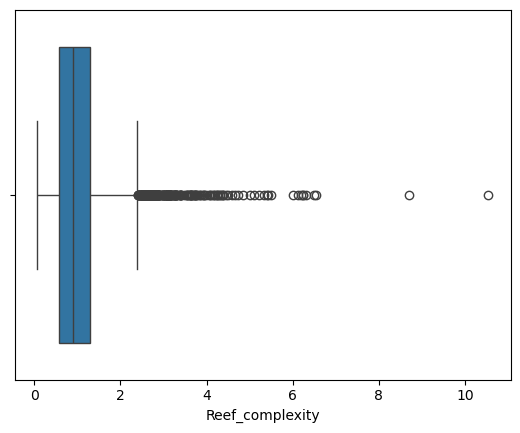

...

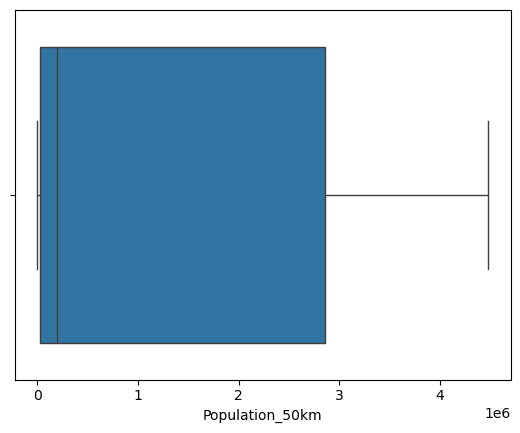

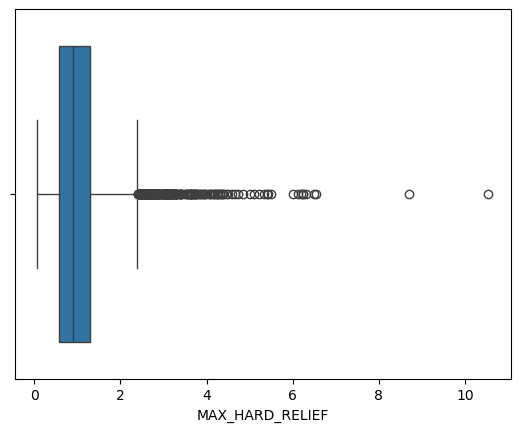

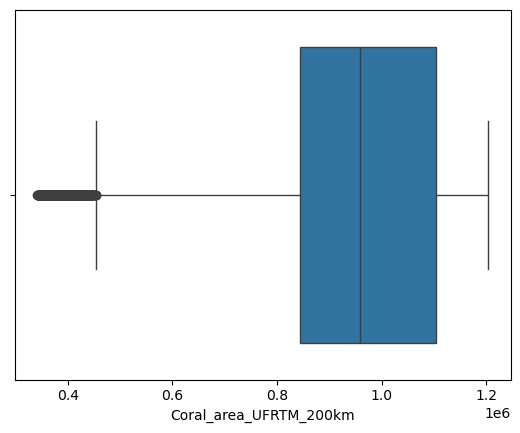

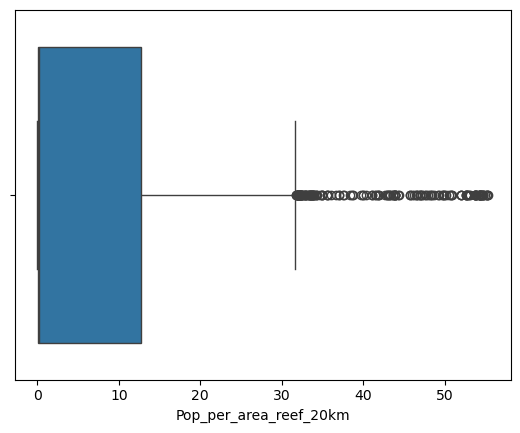

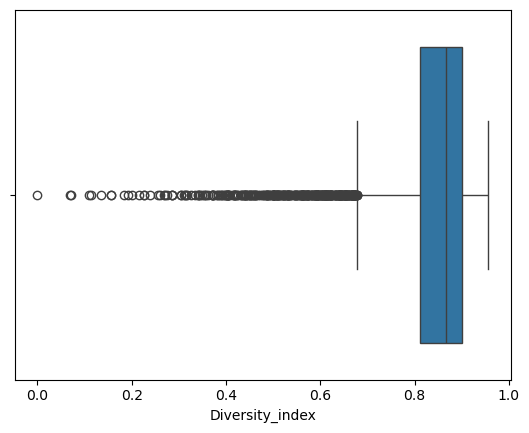

In [189]:
#Check outliers in data set

import warnings
warnings.filterwarnings("ignore")
for i in data.select_dtypes(include='number').columns:
    sns.boxplot(data=data,x=i)
    plt.show()

In [191]:
# Apply IQR only to numeric columns

numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns

for feature in numeric_columns:
    Q1 = data[feature].quantile(0.25)  # First quartile (25%)
    Q3 = data[feature].quantile(0.75)  # Third quartile (75%)
    IQR = Q3 - Q1  # Interquartile Range
    lower = Q1 - 1.5 * IQR  # Lower bound
    upper = Q3 + 1.5 * IQR  # Upper bound
    
    # Check if any value is greater than the upper bound or less than the lower bound (outliers)
    if ((data[feature] > upper) | (data[feature] < lower)).any():
        print(f"{feature} ---> yes")  # Outliers exist
    else:
        print(f"{feature} ---> no")   # No outliers


Latitude ---> no
Longitude ---> no
Depth ---> no
Coral_cover ---> yes
Reef_complexity ---> yes
SST ---> yes
NPP ---> yes
Wave_exposure ---> yes
Coral_area_UFRTM_20km ---> yes
Nursery_seagrass ---> yes
Nursery_mangroves ---> yes
Population_20km ---> no
Population_50km ---> no
MAX_HARD_RELIEF ---> yes
Coral_area_UFRTM_200km ---> yes
Pop_per_area_reef_20km ---> yes
Diversity_index ---> yes


Here we do not do outlier treatment for target variable column,categorical variable columns and discrete variable columns

In [193]:
#Do outlier treatments using IQR method

def wisker(col):
    q1,q3 = np.percentile(col,[25,75])
    iqr = q3 - q1
    lower_wisker = q1-1.5*iqr
    upper_wisker = q3+1.5*iqr
    return lower_wisker,upper_wisker

In [194]:
for i in ['Reef_complexity', 'SST','NPP','Wave_exposure','Coral_area_UFRTM_20km','Nursery_seagrass','Nursery_mangroves','MAX_HARD_RELIEF','Coral_area_UFRTM_200km','Pop_per_area_reef_20km']:
    lower_wisker,upper_wisker = wisker(data[i])
    data[i]=np.where(data[i]<lower_wisker,lower_wisker,data[i])
    data[i]=np.where(data[i]>upper_wisker,upper_wisker,data[i])

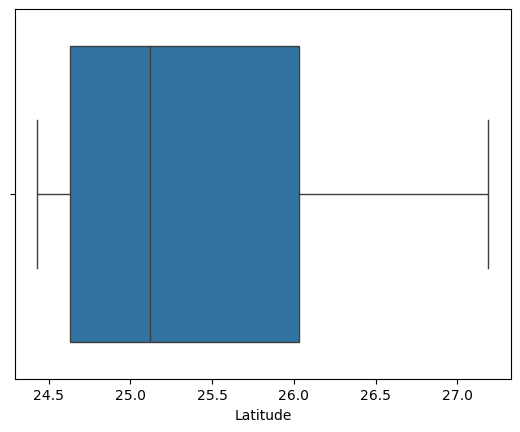

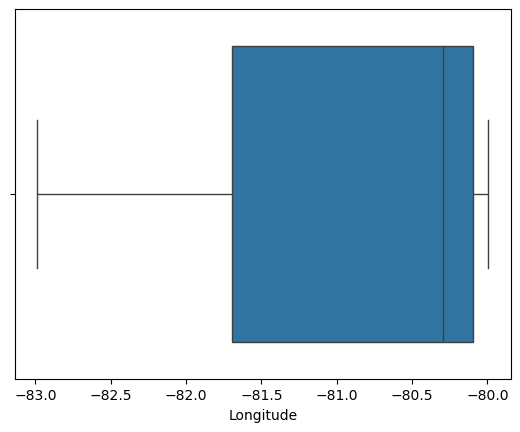

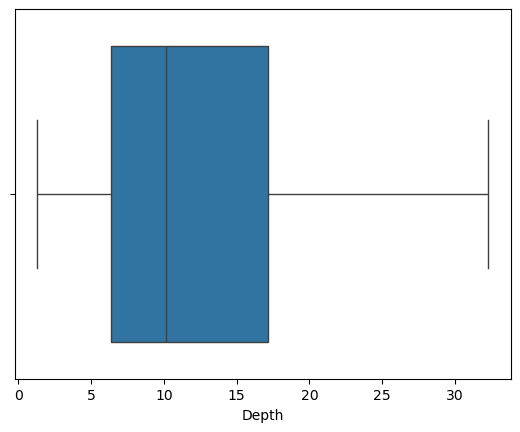

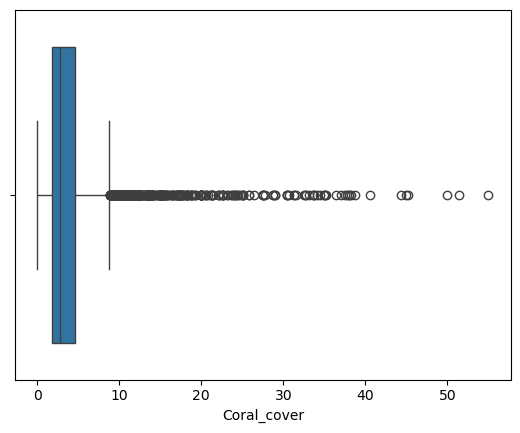

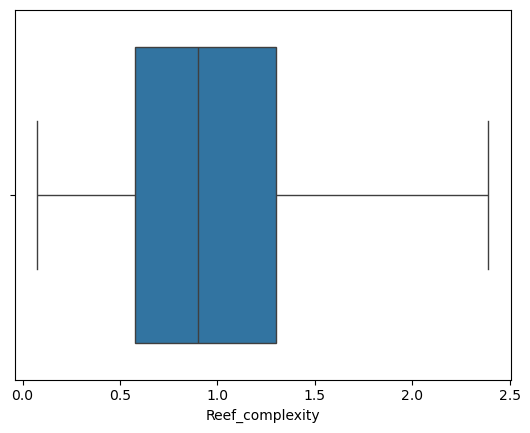

...

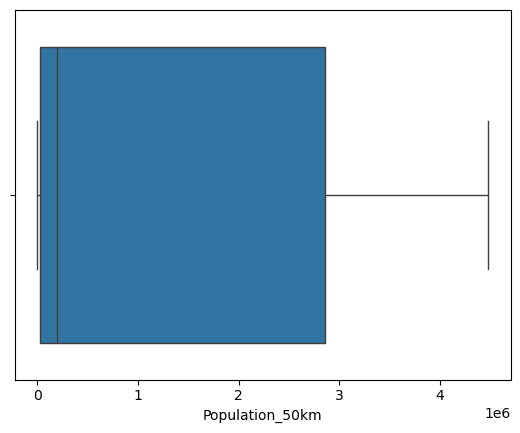

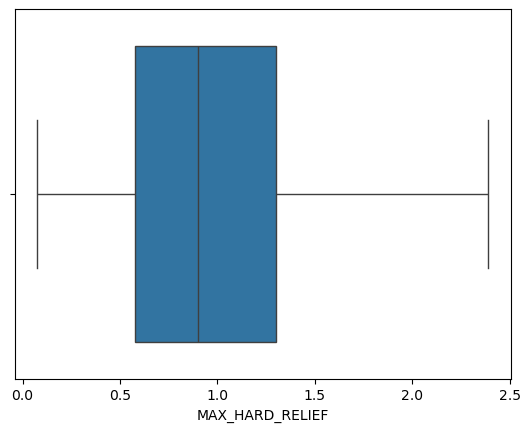

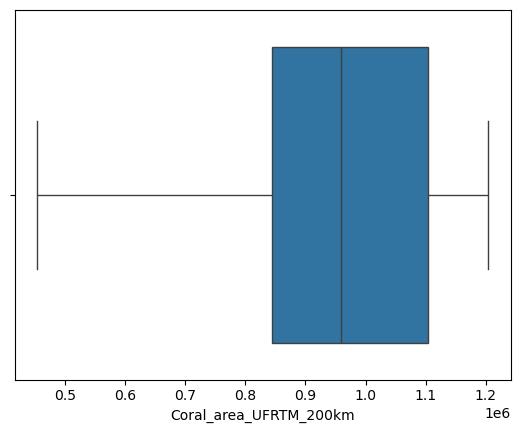

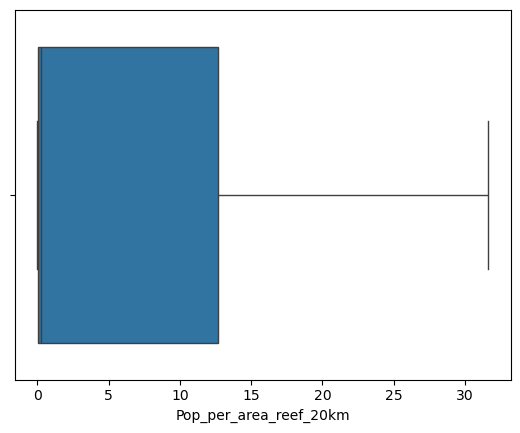

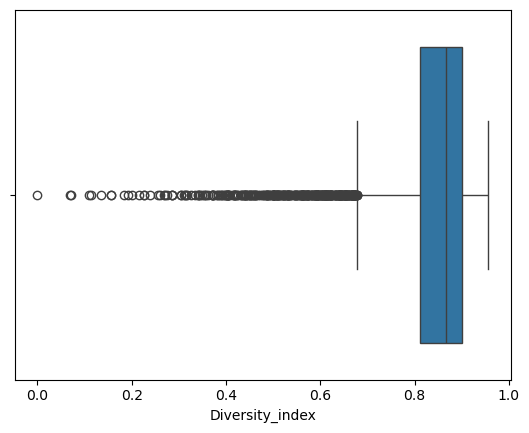

In [195]:
#After the outlier treatments visualize boxplot

for i in data.select_dtypes(include='number').columns:
    sns.boxplot(data=data,x=i)
    plt.show()

## Exploratory data analysis

### Univariate Analysis

<Axes: xlabel='Diversity_index', ylabel='Density'>

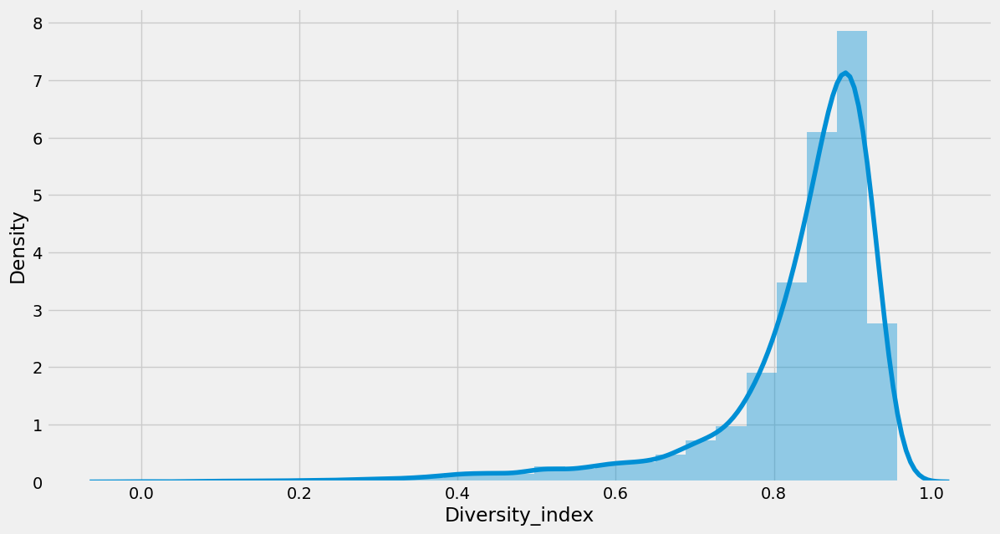

In [200]:
#Displot for Diversity_index(Predict veriable)

plt.style.use('fivethirtyeight')
plt.figure(figsize=(13,7))
sns.distplot(data['Diversity_index'],bins=25)

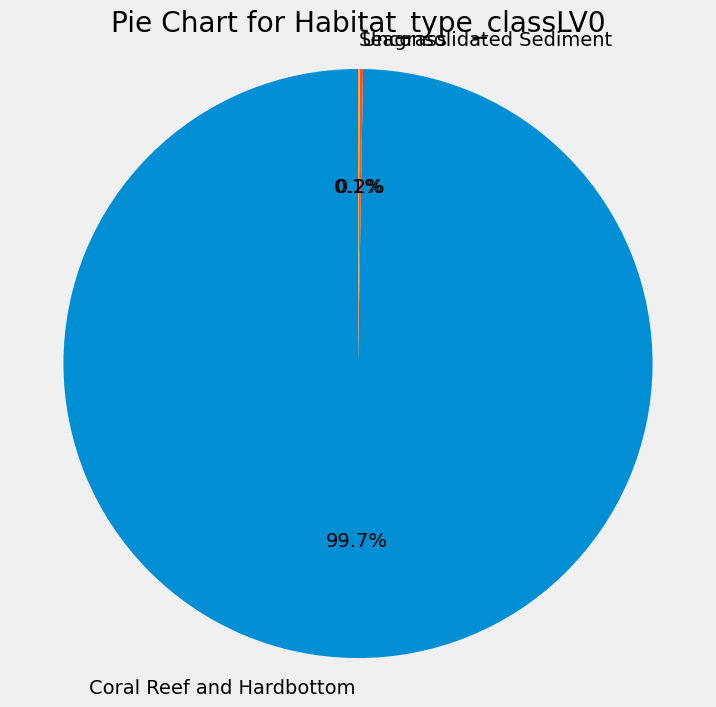

Habitat_type_classLV0
Coral Reef and Hardbottom    3988
Unconsolidated Sediment         7
Seagrass                        4
Name: count, dtype: int64
**************************


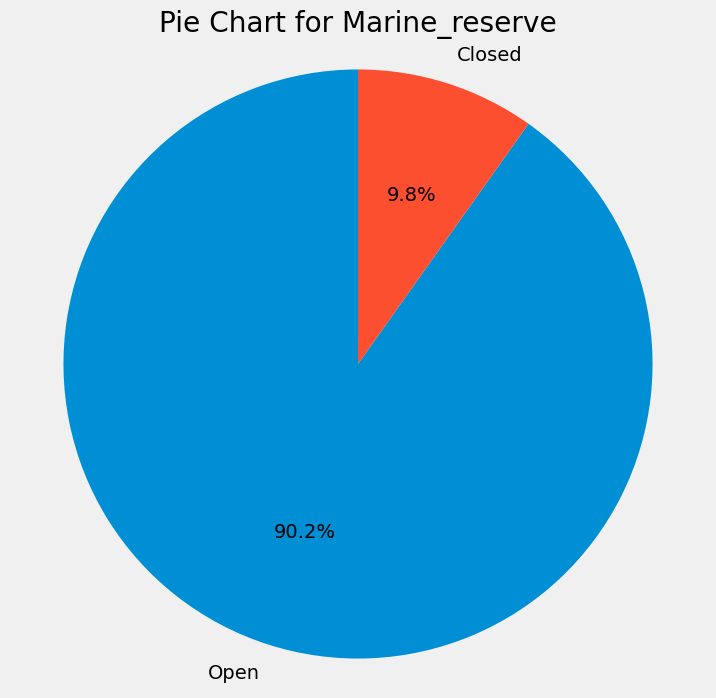

Marine_reserve
Open      3606
Closed     393
Name: count, dtype: int64
**************************


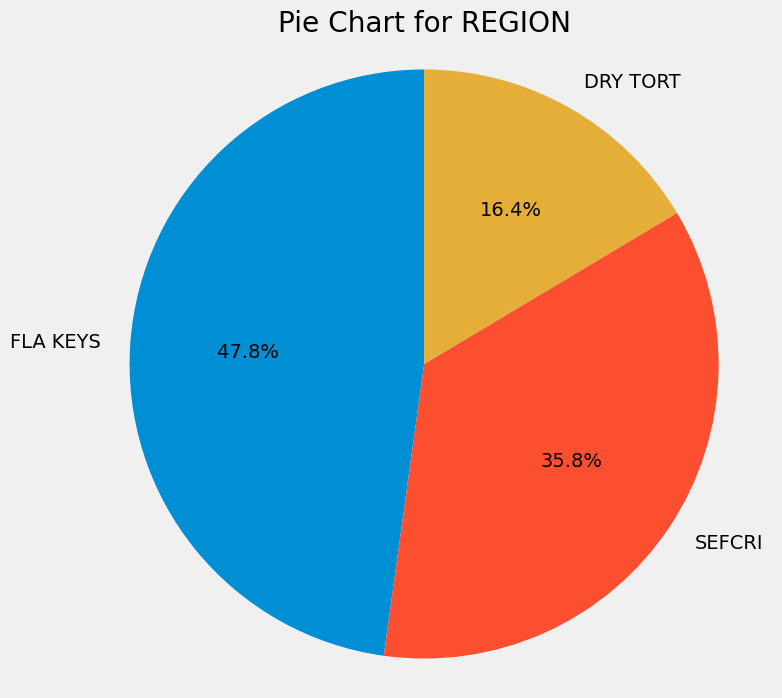

REGION
FLA KEYS    1912
SEFCRI      1430
DRY TORT     657
Name: count, dtype: int64
**************************


In [203]:
#Visualize Categorical data columns value counts

# List of columns to plot pie charts
columns_to_plot = ['Habitat_type_classLV0', 'Marine_reserve', 'REGION']

# Plotting pie charts for each specified column
for column in columns_to_plot:
    plt.figure(figsize=(8, 8))
    
    # Getting value counts for the column
    value_counts = data[column].value_counts()
    
    # Plotting the pie chart
    plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=90)
    plt.title(f'Pie Chart for {column}')
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    
    plt.show()
    
    # Print value counts (Optional)
    print(value_counts)
    print("**************************")


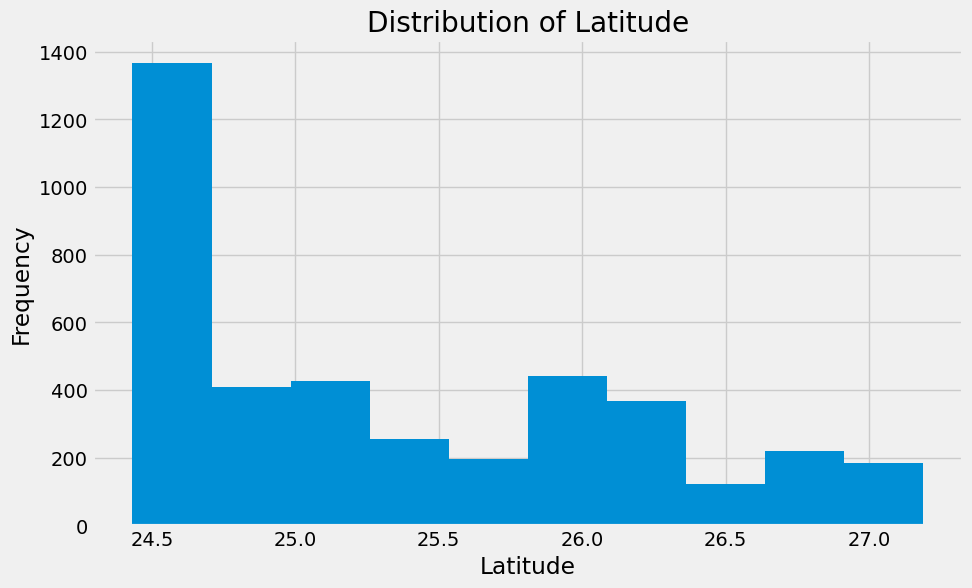

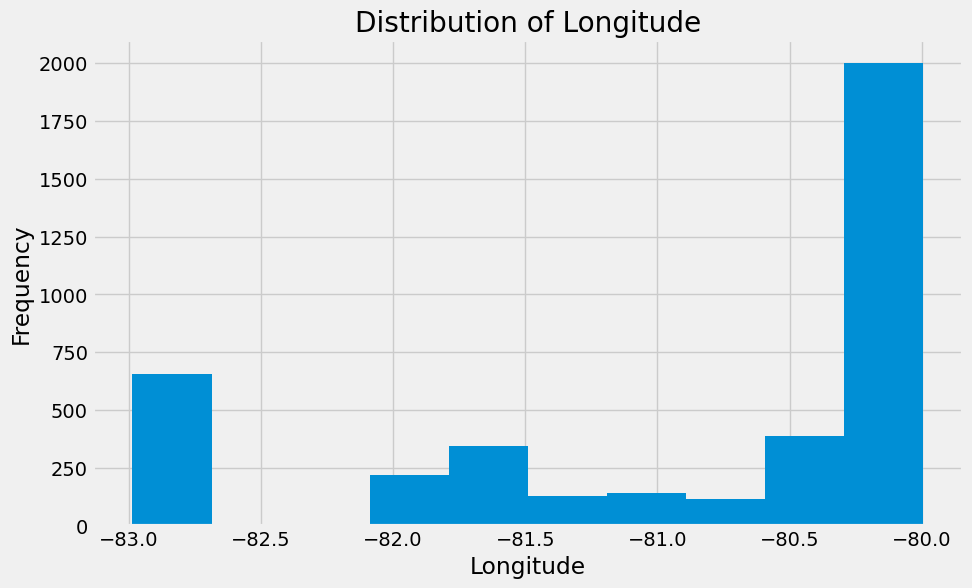

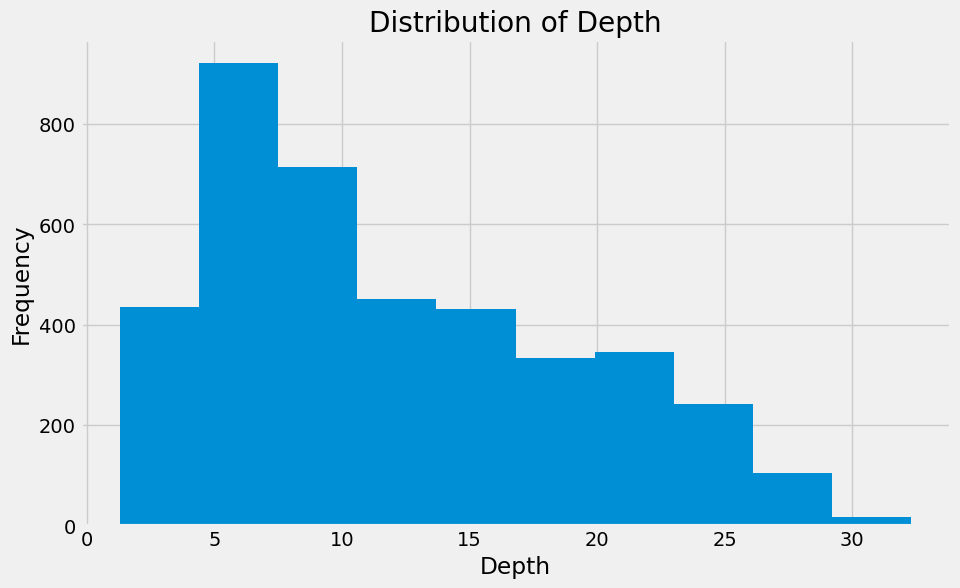

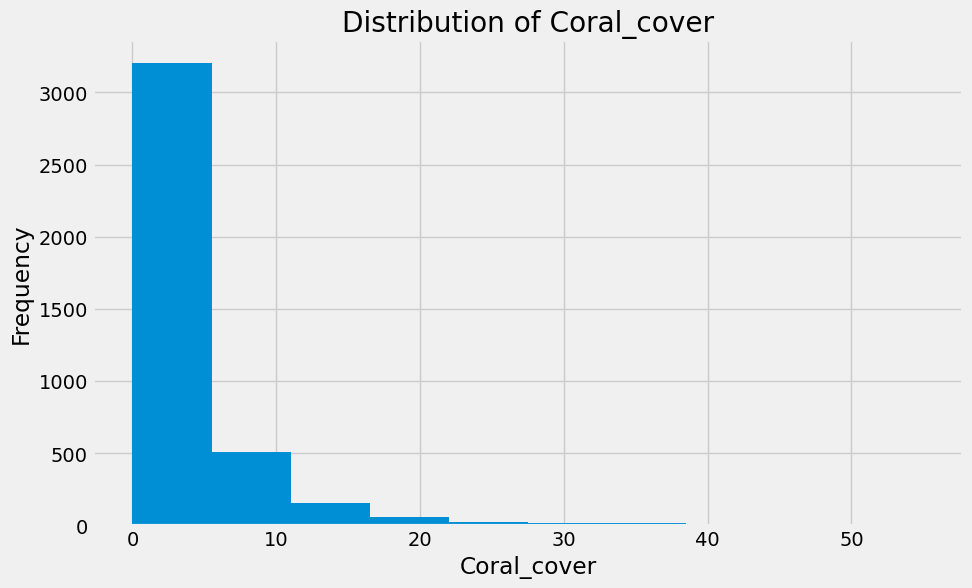

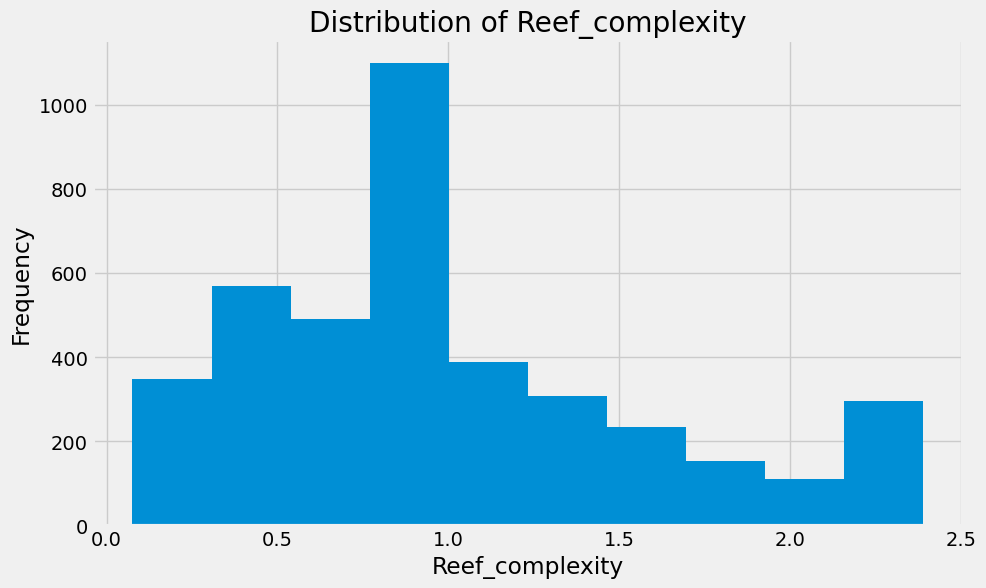

...

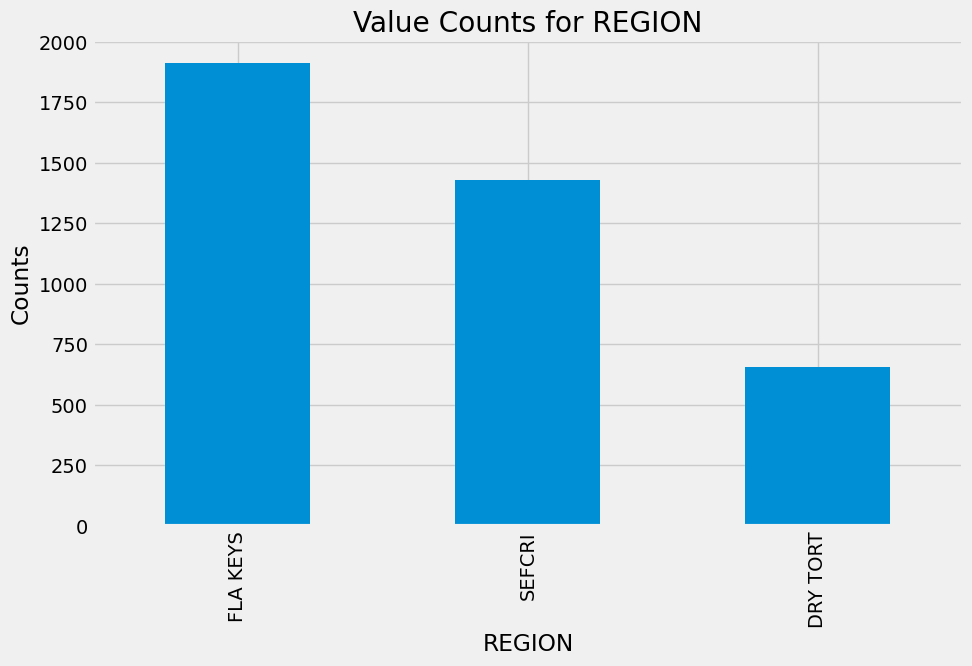

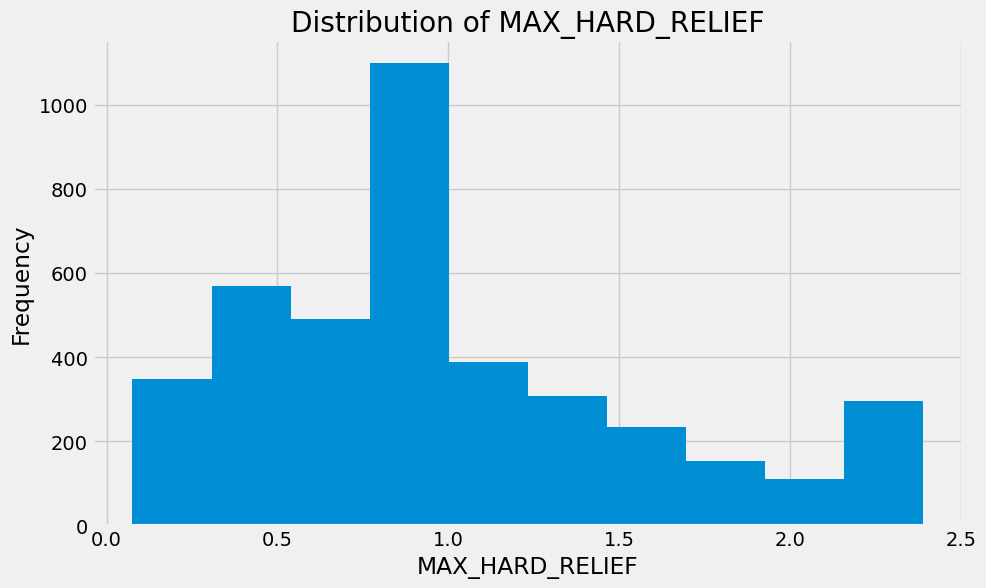

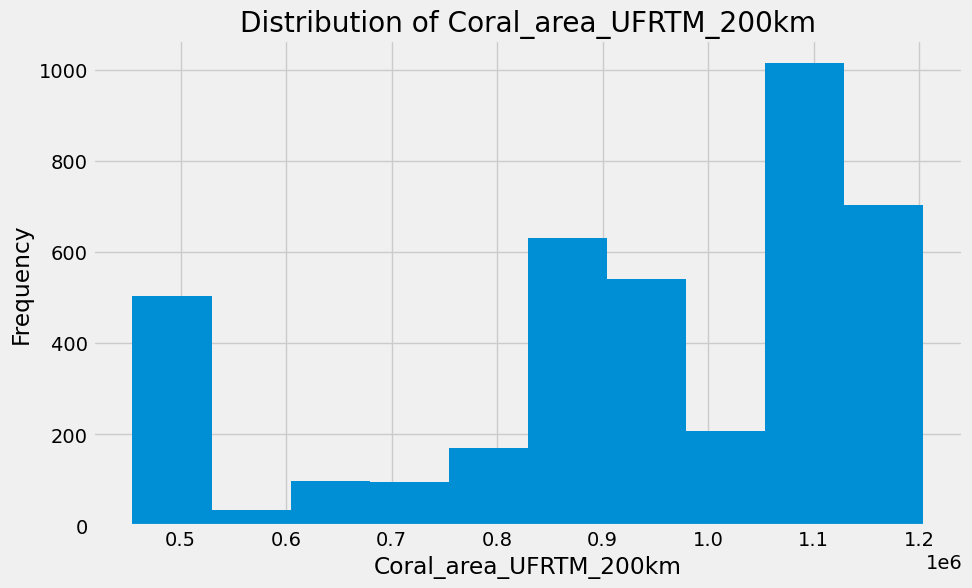

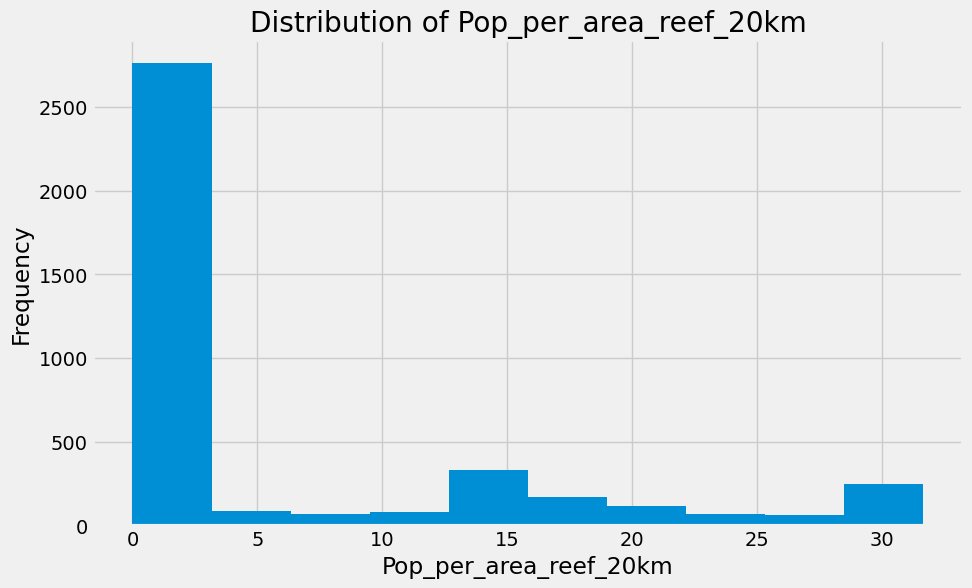

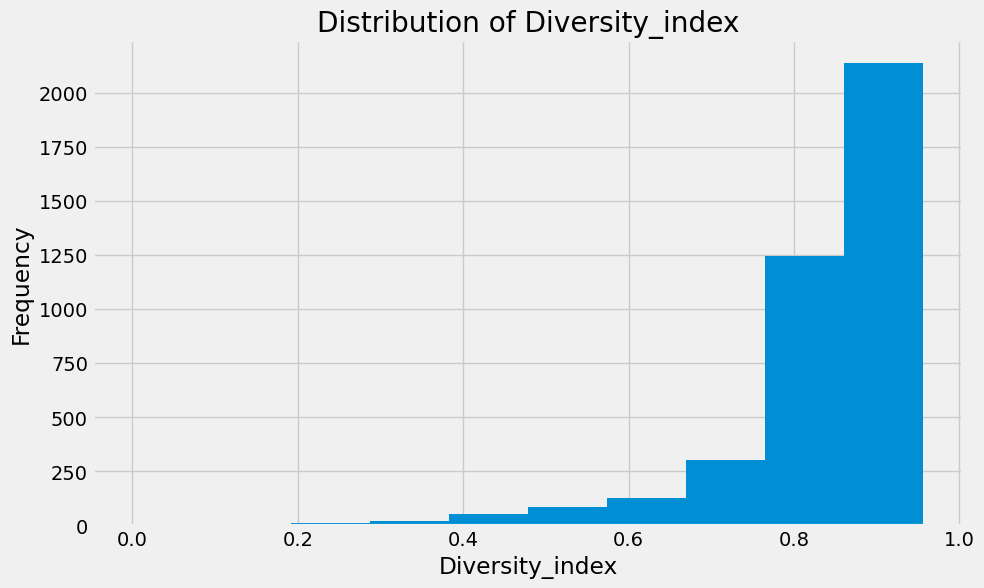

In [204]:
# Plotting value counts for each column
for column in data.columns:
    plt.figure(figsize=(10, 6))
    
    if data[column].dtype == 'object':  # Categorical data
        data[column].value_counts().plot(kind='bar')
        plt.title(f'Value Counts for {column}')
        plt.xlabel(column)
        plt.ylabel('Counts')
    else:  # Numerical data
        data[column].plot(kind='hist', bins=10)
        plt.title(f'Distribution of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
    
    plt.show()

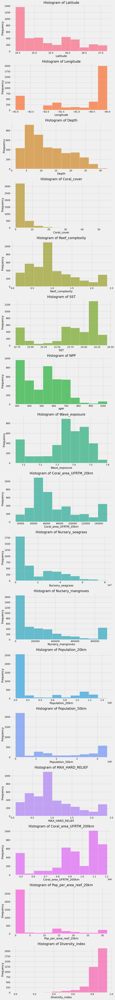

In [205]:
#plot histogrames foe numerical columns

# Identify numerical columns
numerical_columns = data.select_dtypes(include=['number']).columns

# Define a list of colors
colors = sns.color_palette("husl", len(numerical_columns))

# Create subplots
num_cols = len(numerical_columns)
fig, axes = plt.subplots(nrows=num_cols, ncols=1, figsize=(10, 5 * num_cols))

# Plot histograms
for i, (column, color) in enumerate(zip(numerical_columns, colors)):
    sns.histplot(data[column], bins=10, color=color, ax=axes[i])
    axes[i].set_title(f'Histogram of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Adjust layout
plt.tight_layout()
plt.show()



## Bivariate analysis

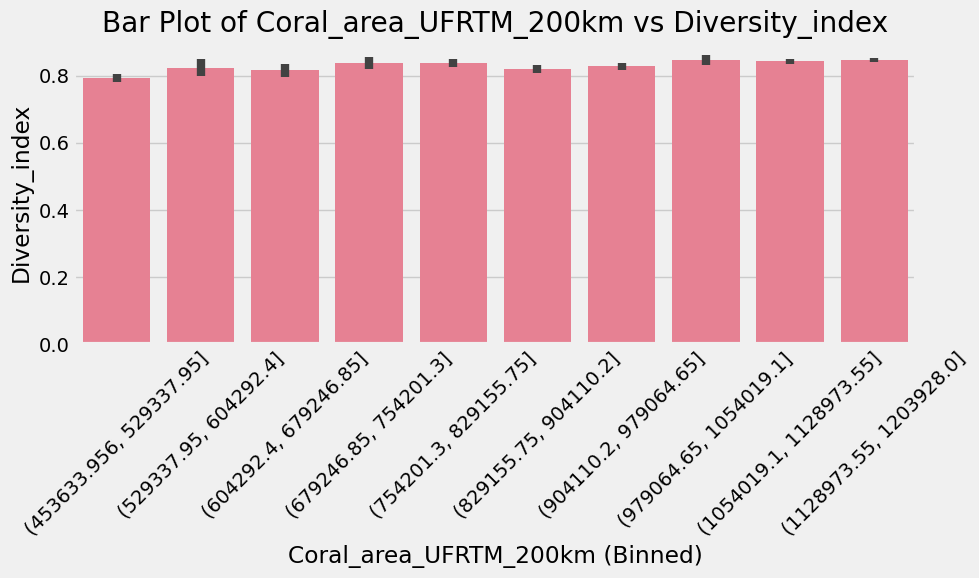

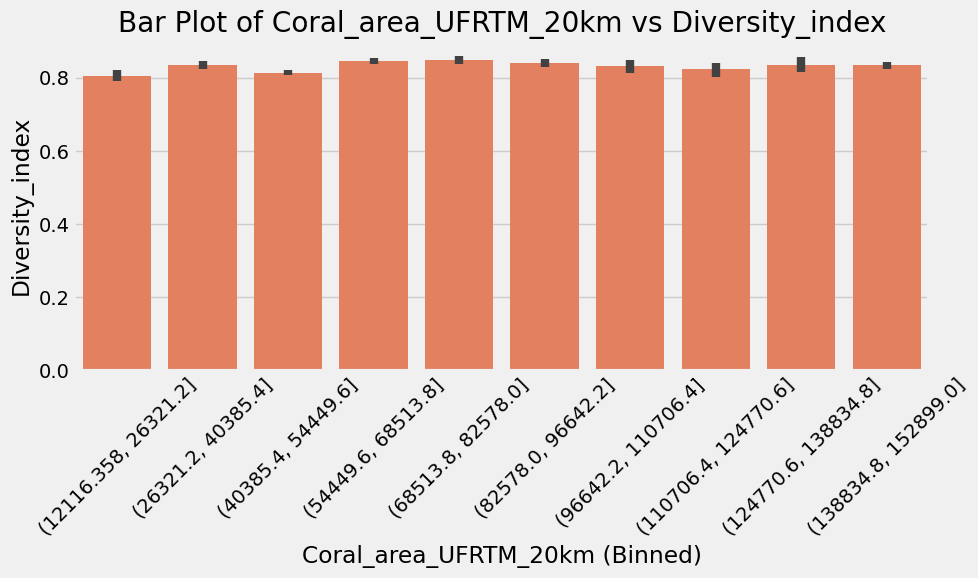

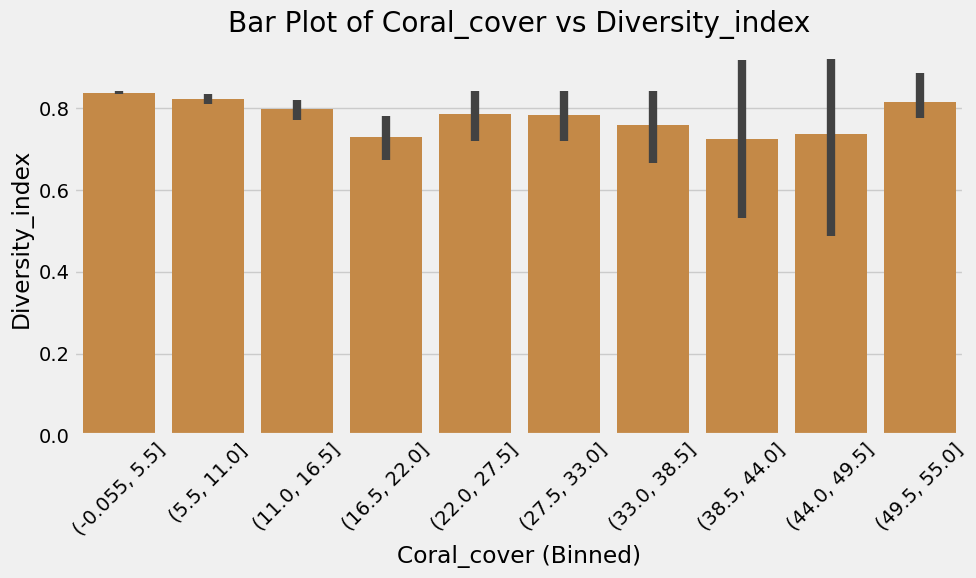

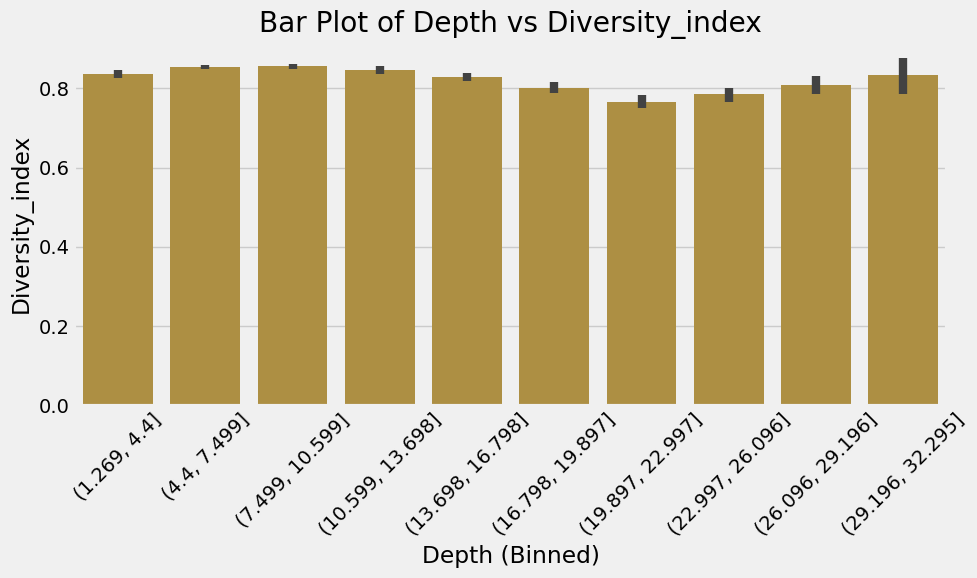

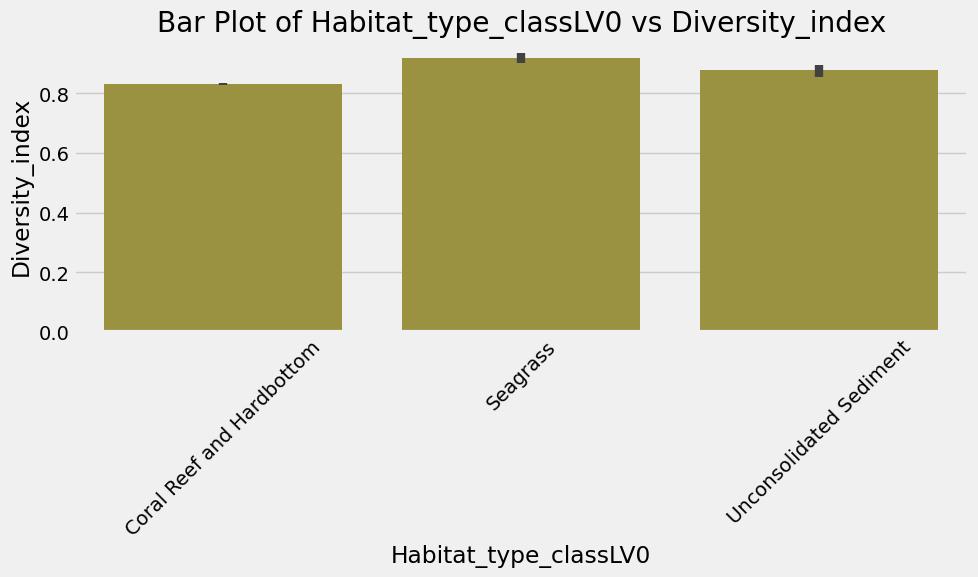

...

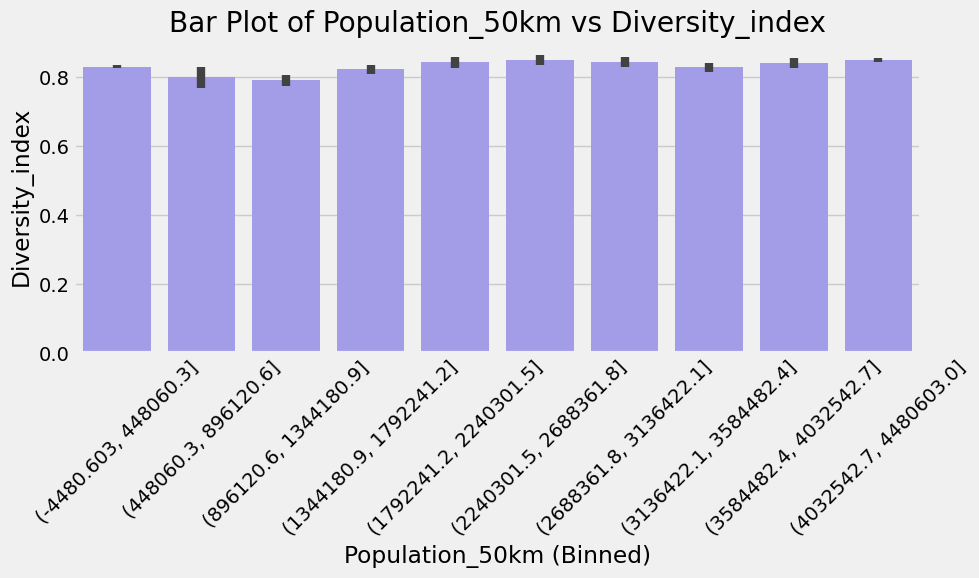

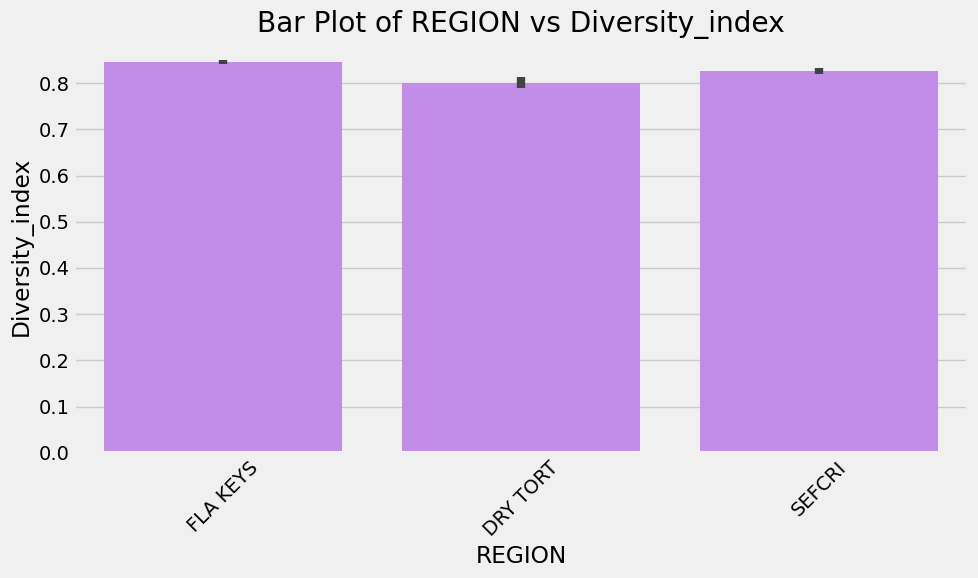

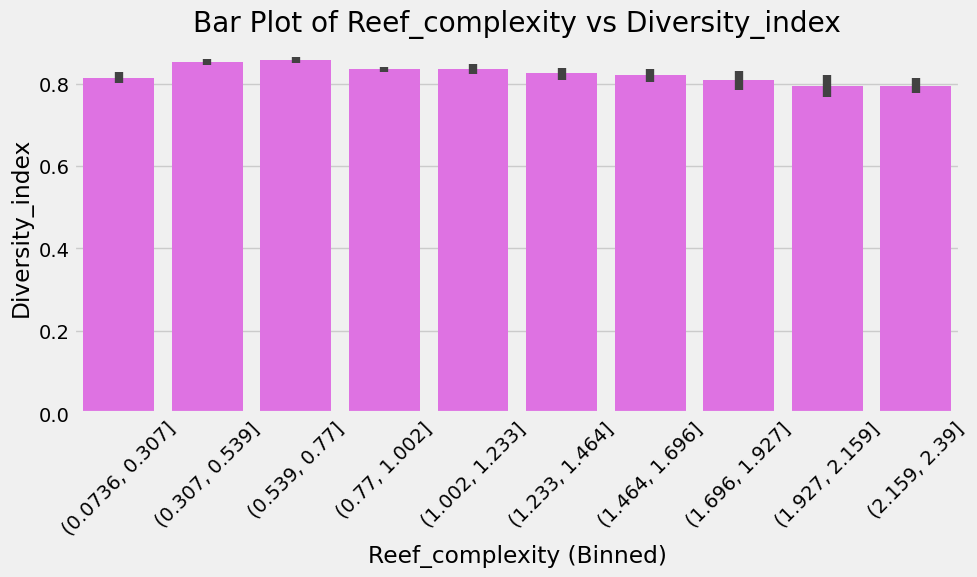

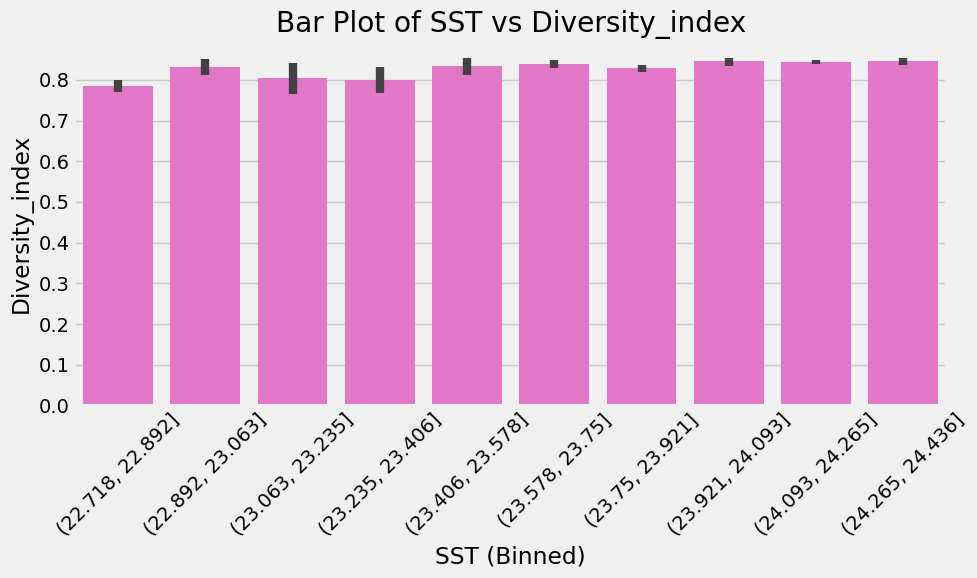

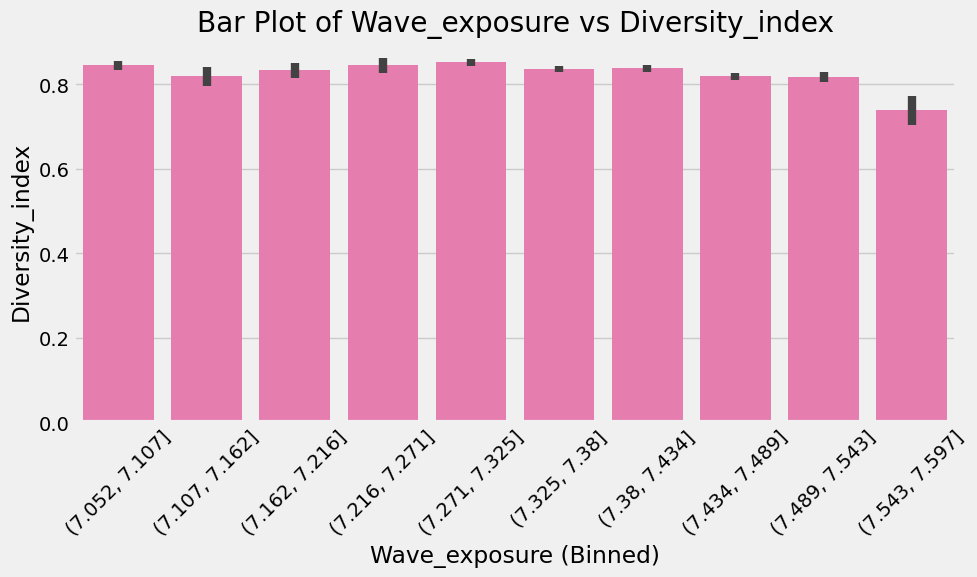

In [209]:


# List of columns excluding the target variable
columns_to_plot = data.columns.difference(['Diversity_index'])

# Define a list of colors
colors = sns.color_palette("husl", len(columns_to_plot))

# Plot bar plots for each variable against 'Diversity_index'
for col, color in zip(columns_to_plot, colors):
    plt.figure(figsize=(10, 6))
    
    if data[col].dtype == 'object':  # If it's a categorical variable
        sns.barplot(x=col, y='Diversity_index', data=data, color=color)
        plt.title(f'Bar Plot of {col} vs Diversity_index')
        plt.xticks(rotation=45)  # Rotate x-axis labels if needed for readability
        plt.xlabel(col)
        plt.ylabel('Diversity_index')
        
    else:  # If it's a numerical variable, bin it and then plot
        binned_col = pd.cut(data[col], bins=10)  # Create bins for numerical columns
        sns.barplot(x=binned_col, y='Diversity_index', data=data, color=color)
        plt.title(f'Bar Plot of {col} vs Diversity_index')
        plt.xticks(rotation=45)
        plt.xlabel(f'{col} (Binned)')
        plt.ylabel('Diversity_index')
    
    plt.tight_layout()
    plt.show()


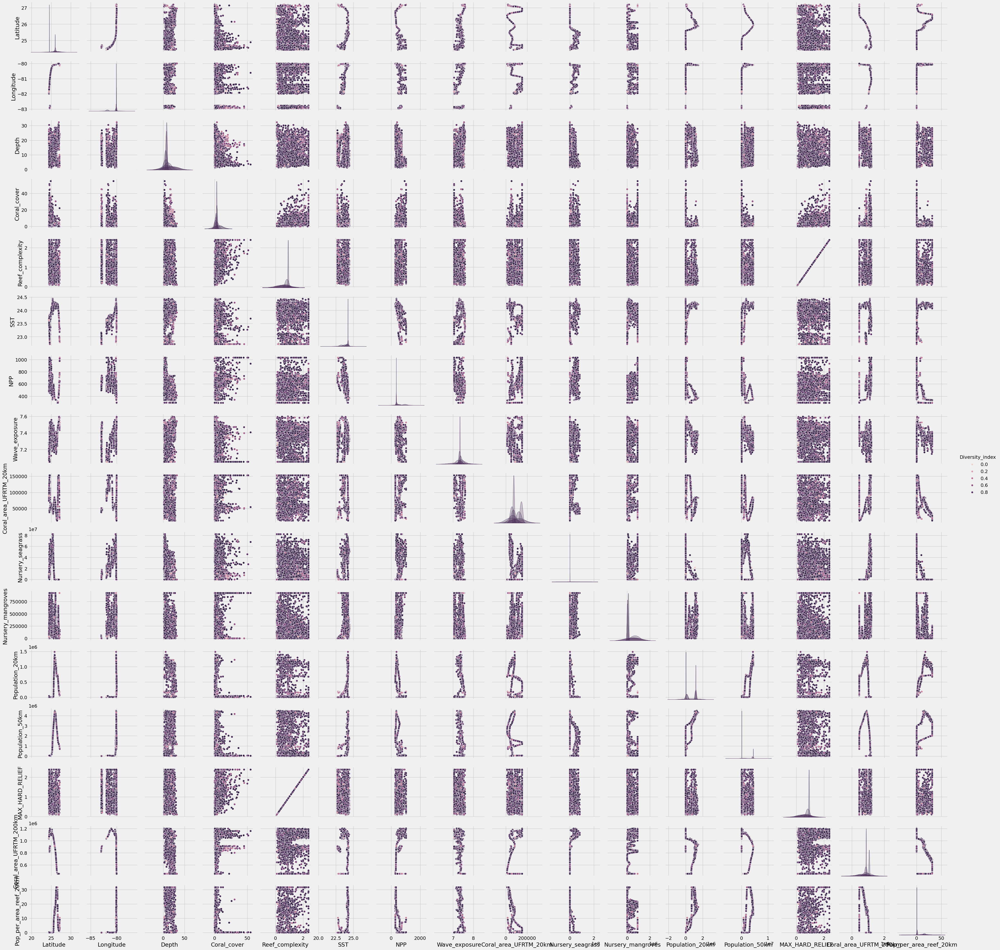

In [211]:
#pair plot
graph = sns.pairplot(data,hue="Diversity_index")

### Feature Engineering

In [213]:
#First we look at what are the categorical veriables
# String or category dtype
categorical_columns = data.select_dtypes(include=['object', 'category']).columns.tolist()

# Integer columns with a small number of unique values
possible_categorical_columns = [col for col in data.columns if pd.api.types.is_integer_dtype(data[col]) and data[col].nunique() < 10]

# Combine both
all_categorical_columns = categorical_columns + possible_categorical_columns
print("All Categorical Columns:", all_categorical_columns)

All Categorical Columns: ['Habitat_type_classLV0', 'Marine_reserve', 'REGION']


In [214]:
#Let's have a look at how many labels each veriable has

for col in all_categorical_columns:
    print(col,':',len(data[col].unique()),'labels')

Habitat_type_classLV0 : 3 labels
Marine_reserve : 2 labels
REGION : 3 labels


In [215]:
# number of value counts in each Object columns

for i in['Habitat_type_classLV0', 'Marine_reserve', 'REGION']:
    print(data[i].value_counts())
    print("**************************")

Habitat_type_classLV0
Coral Reef and Hardbottom    3988
Unconsolidated Sediment         7
Seagrass                        4
Name: count, dtype: int64
**************************
Marine_reserve
Open      3606
Closed     393
Name: count, dtype: int64
**************************
REGION
FLA KEYS    1912
SEFCRI      1430
DRY TORT     657
Name: count, dtype: int64
**************************


In [216]:
#convert categorical data into numerical data using one-hot encoding
data = pd.get_dummies(data,columns = ['Habitat_type_classLV0', 'Marine_reserve', 'REGION'],dtype = int)

In [217]:
data.head()

,Latitude,Longitude,Depth,Coral_cover,Reef_complexity,SST,NPP,Wave_exposure,Coral_area_UFRTM_20km,Nursery_seagrass,...,Pop_per_area_reef_20km,Diversity_index,Habitat_type_classLV0_Coral Reef and Hardbottom,Habitat_type_classLV0_Seagrass,Habitat_type_classLV0_Unconsolidated Sediment,Marine_reserve_Closed,Marine_reserve_Open,REGION_DRY TORT,REGION_FLA KEYS,REGION_SEFCRI
0,24.446433,-81.962900,9.800000,2.000000,0.550322,23.595392,550.865051,7.0527,88333.0,6483631.0,...,0.047128,0.877755,1,0,0,0,1,0,1,0
1,24.461130,-81.840099,8.821212,6.181818,1.886364,23.578271,577.431946,7.0527,91742.0,11501368.0,...,0.403795,0.912085,1,0,0,0,1,0,1,0
2,24.467250,-81.832367,17.399239,7.506345,0.749873,23.551355,595.320252,7.0527,94607.0,12102752.0,...,0.392888,0.882112,1,0,0,0,1,0,1,0
3,24.468767,-81.822167,9.200000,10.000000,0.400000,23.556451,590.443543,7.0527,96139.0,11003196.0,...,0.386919,0.806049,1,0,0,0,1,0,1,0
4,24.470206,-81.808148,8.558032,2.870486,0.289415,23.567590,579.874023,7.0527,98167.0,9313051.0,...,0.383887,0.829156,1,0,0,0,1,0,1,0


In [218]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 25 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Latitude                                         3999 non-null   float64
 1   Longitude                                        3999 non-null   float64
 2   Depth                                            3999 non-null   float64
 3   Coral_cover                                      3999 non-null   float64
 4   Reef_complexity                                  3999 non-null   float64
 5   SST                                              3999 non-null   float64
 6   NPP                                              3999 non-null   float64
 7   Wave_exposure                                    3999 non-null   float64
 8   Coral_area_UFRTM_20km                            3999 non-null   float64
 9   Nursery_seagrass              

In [219]:
data.columns

Index(['Latitude', 'Longitude', 'Depth', 'Coral_cover', 'Reef_complexity',
       'SST', 'NPP', 'Wave_exposure', 'Coral_area_UFRTM_20km',
       'Nursery_seagrass', 'Nursery_mangroves', 'Population_20km',
       'Population_50km', 'MAX_HARD_RELIEF', 'Coral_area_UFRTM_200km',
       'Pop_per_area_reef_20km', 'Diversity_index',
       'Habitat_type_classLV0_Coral Reef and Hardbottom',
       'Habitat_type_classLV0_Seagrass',
       'Habitat_type_classLV0_Unconsolidated Sediment',
       'Marine_reserve_Closed', 'Marine_reserve_Open', 'REGION_DRY TORT',
       'REGION_FLA KEYS', 'REGION_SEFCRI'],
      dtype='object')

In [220]:
#Change data set columns name by meaningful names

data = data.rename(columns = {
    'Habitat_type_classLV0_Coral Reef and Hardbottom':'Coral Reef and Hardbottom',
    'Habitat_type_classLV0_Seagrass':'Seagrass',
    'Habitat_type_classLV0_Unconsolidated Sediment' : 'Sediment',
    'Marine_reserve_Closed' : 'Closed',
    'Marine_reserve_Open' : 'Open',
    'REGION_DRY TORT':'DRY TORT' ,
    'REGION_FLA KEYS':'FLA KEYS',
    'REGION_SEFCRI' :'SEFCRI'
})

## Feature Scaling

In [223]:
#convert all values into one scaller

from sklearn.preprocessing import StandardScaler
StandardScaler = StandardScaler()
columns_to_scale = ['Latitude', 'Longitude', 'Depth', 'Coral_cover', 'Reef_complexity',
       'SST', 'NPP', 'Wave_exposure', 'Coral_area_UFRTM_20km',
       'Nursery_seagrass', 'Nursery_mangroves', 'Population_20km',
       'Population_50km', 'MAX_HARD_RELIEF', 'Coral_area_UFRTM_200km',
       'Pop_per_area_reef_20km']
data[columns_to_scale] = StandardScaler.fit_transform(data[columns_to_scale])

In [224]:
data.head()

,Latitude,Longitude,Depth,Coral_cover,Reef_complexity,SST,NPP,Wave_exposure,Coral_area_UFRTM_20km,Nursery_seagrass,...,Pop_per_area_reef_20km,Diversity_index,Coral Reef and Hardbottom,Seagrass,Sediment,Closed,Open,DRY TORT,FLA KEYS,SEFCRI
0,-1.134830,-0.999042,-0.321418,-0.441624,-0.787562,-0.357455,0.184211,-2.076475,0.382302,-0.576198,...,-0.611994,0.877755,1,0,0,0,1,0,1,0
1,-1.116610,-0.882199,-0.462417,0.385398,1.495119,-0.390832,0.352651,-2.076475,0.473057,-0.321179,...,-0.574988,0.912085,1,0,0,0,1,0,1,0
2,-1.109023,-0.874842,0.773286,0.647345,-0.446621,-0.443307,0.466067,-2.076475,0.549329,-0.290615,...,-0.576119,0.882112,1,0,0,0,1,0,1,0
3,-1.107143,-0.865137,-0.407851,1.140506,-1.044393,-0.433371,0.435147,-2.076475,0.590113,-0.346498,...,-0.576739,0.806049,1,0,0,0,1,0,1,0
4,-1.105358,-0.851799,-0.500329,-0.269472,-1.233332,-0.411655,0.368134,-2.076475,0.644103,-0.432397,...,-0.577053,0.829156,1,0,0,0,1,0,1,0


### Feature selection

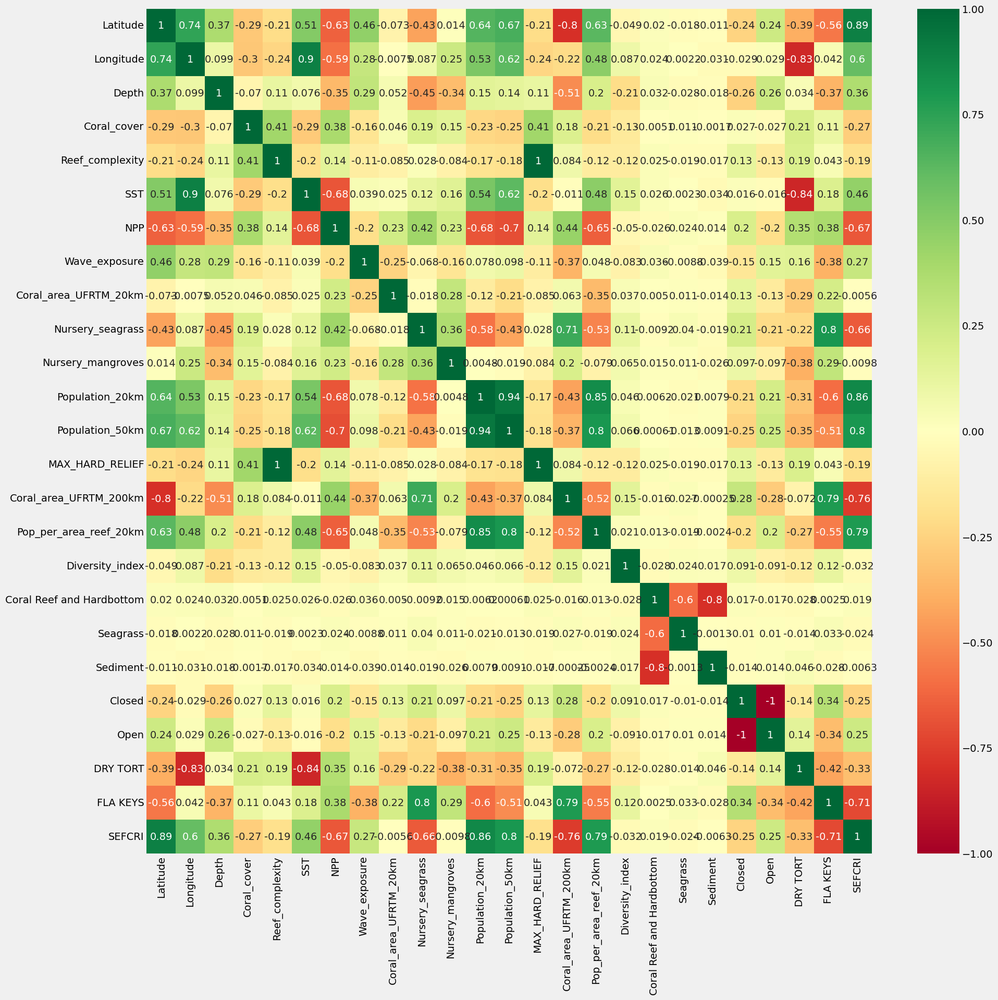

In [226]:
#get correlations of each features in data set
corr_matrix = data.corr()
top_corr_features = corr_matrix.index
plt.figure(figsize=(20,20))
#plot heat map
g =sns.heatmap(data[top_corr_features].corr(),annot = True,cmap="RdYlGn")

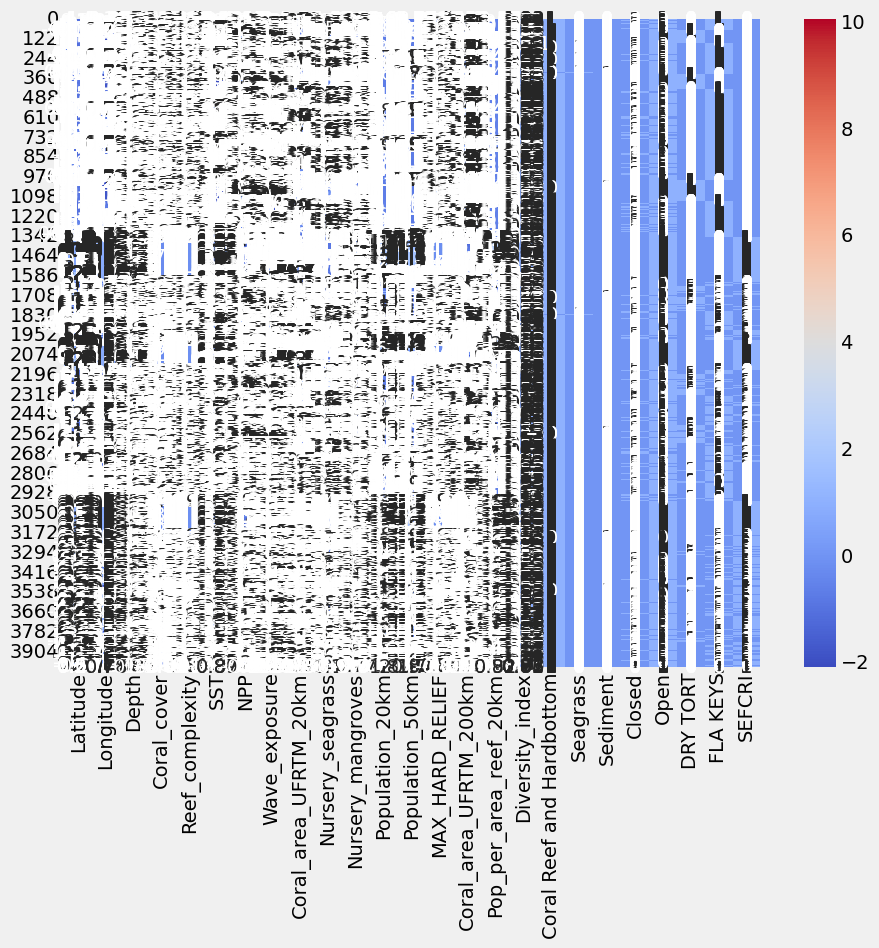

In [227]:
# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(data, annot=True, cmap='coolwarm')
plt.show()

In [228]:
corr_matrix['Diversity_index']

Latitude                    -0.049113
Longitude                    0.087126
Depth                       -0.207735
Coral_cover                 -0.134506
Reef_complexity             -0.117921
SST                          0.154381
NPP                         -0.049795
Wave_exposure               -0.083307
Coral_area_UFRTM_20km        0.036718
Nursery_seagrass             0.111056
Nursery_mangroves            0.065254
Population_20km              0.045993
Population_50km              0.066104
MAX_HARD_RELIEF             -0.117921
Coral_area_UFRTM_200km       0.145244
Pop_per_area_reef_20km       0.021497
Diversity_index              1.000000
Coral Reef and Hardbottom   -0.027661
Seagrass                     0.023801
Sediment                     0.016659
Closed                       0.091292
Open                        -0.091292
DRY TORT                    -0.118064
FLA KEYS                     0.118058
SEFCRI                      -0.031766
Name: Diversity_index, dtype: float64

In [230]:
# According to the correlation we remove < 0.1 columns
# Get column names where the correlation with 'Diversity_index' is less than 0.01

column_names = corr_matrix[(corr_matrix['Diversity_index'] > -0.1) & (corr_matrix['Diversity_index'] < 0.1)].index.tolist()
print(column_names)

['Latitude', 'Longitude', 'NPP', 'Wave_exposure', 'Coral_area_UFRTM_20km', 'Nursery_mangroves', 'Population_20km', 'Population_50km', 'Pop_per_area_reef_20km', 'Coral Reef and Hardbottom', 'Seagrass', 'Sediment', 'Closed', 'Open', 'SEFCRI']


In [231]:
data.head()

,Latitude,Longitude,Depth,Coral_cover,Reef_complexity,SST,NPP,Wave_exposure,Coral_area_UFRTM_20km,Nursery_seagrass,...,Pop_per_area_reef_20km,Diversity_index,Coral Reef and Hardbottom,Seagrass,Sediment,Closed,Open,DRY TORT,FLA KEYS,SEFCRI
0,-1.134830,-0.999042,-0.321418,-0.441624,-0.787562,-0.357455,0.184211,-2.076475,0.382302,-0.576198,...,-0.611994,0.877755,1,0,0,0,1,0,1,0
1,-1.116610,-0.882199,-0.462417,0.385398,1.495119,-0.390832,0.352651,-2.076475,0.473057,-0.321179,...,-0.574988,0.912085,1,0,0,0,1,0,1,0
2,-1.109023,-0.874842,0.773286,0.647345,-0.446621,-0.443307,0.466067,-2.076475,0.549329,-0.290615,...,-0.576119,0.882112,1,0,0,0,1,0,1,0
3,-1.107143,-0.865137,-0.407851,1.140506,-1.044393,-0.433371,0.435147,-2.076475,0.590113,-0.346498,...,-0.576739,0.806049,1,0,0,0,1,0,1,0
4,-1.105358,-0.851799,-0.500329,-0.269472,-1.233332,-0.411655,0.368134,-2.076475,0.644103,-0.432397,...,-0.577053,0.829156,1,0,0,0,1,0,1,0


In [232]:
data.columns

Index(['Latitude', 'Longitude', 'Depth', 'Coral_cover', 'Reef_complexity',
       'SST', 'NPP', 'Wave_exposure', 'Coral_area_UFRTM_20km',
       'Nursery_seagrass', 'Nursery_mangroves', 'Population_20km',
       'Population_50km', 'MAX_HARD_RELIEF', 'Coral_area_UFRTM_200km',
       'Pop_per_area_reef_20km', 'Diversity_index',
       'Coral Reef and Hardbottom', 'Seagrass', 'Sediment', 'Closed', 'Open',
       'DRY TORT', 'FLA KEYS', 'SEFCRI'],
      dtype='object')

In [233]:
# According to the correlation we remove < 0.1 columns

data = data.drop(['Latitude','Longitude','NPP','Wave_exposure','Coral_area_UFRTM_20km','Nursery_mangroves','Population_20km','Population_50km','Pop_per_area_reef_20km','Coral Reef and Hardbottom','Seagrass','Sediment','Closed','Open','SEFCRI'],axis=1)


In [234]:
data.columns

Index(['Depth', 'Coral_cover', 'Reef_complexity', 'SST', 'Nursery_seagrass',
       'MAX_HARD_RELIEF', 'Coral_area_UFRTM_200km', 'Diversity_index',
       'DRY TORT', 'FLA KEYS'],
      dtype='object')

In [235]:
# new data set

data.head()

,Depth,Coral_cover,Reef_complexity,SST,Nursery_seagrass,MAX_HARD_RELIEF,Coral_area_UFRTM_200km,Diversity_index,DRY TORT,FLA KEYS
0,-0.321418,-0.441624,-0.787562,-0.357455,-0.576198,-0.787562,0.509680,0.877755,0,1
1,-0.462417,0.385398,1.495119,-0.390832,-0.321179,1.495119,0.587045,0.912085,0,1
2,0.773286,0.647345,-0.446621,-0.443307,-0.290615,-0.446621,0.591496,0.882112,0,1
3,-0.407851,1.140506,-1.044393,-0.433371,-0.346498,-1.044393,0.596607,0.806049,0,1
4,-0.500329,-0.269472,-1.233332,-0.411655,-0.432397,-1.233332,0.602199,0.829156,0,1


In [236]:
data.shape

(3999, 10)

In [237]:
#select features in x and y
x = data.drop('Diversity_index',axis=1)
y = data['Diversity_index']

In [238]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [242]:
# Display the shapes of the resulting datasets
print("x_train shape:", x_train.shape)
print("x_test shape:", x_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

x_train shape: (2799, 9)
x_test shape: (1200, 9)
y_train shape: (2799,)
y_test shape: (1200,)


In [243]:
#import algorithms libraries
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import BayesianRidge
from sklearn import metrics

from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, mean_squared_error, r2_score,mean_absolute_error
from sklearn.pipeline import Pipeline


In [244]:
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(),
    'Lasso Regression': Lasso(),
    'ElasticNet Regression': ElasticNet(),
    'Bayesian Ridge Regression': BayesianRidge(),
    'Support Vector Regression': SVR(),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'KNN Regression': KNeighborsRegressor()
}


In [245]:
# Define a custom scorer for MSE (negate the default since cross_val_score minimizes the score)
mse_scorer = make_scorer(mean_squared_error, greater_is_better=False)

In [246]:
# Define the number of folds for cross-validation
k = 5

# Dictionary to store cross-validation results for both MSE and R²
cv_results = {}

for name, model in models.items():
    # Perform cross-validation for MSE (negate to get positive MSE)
    mse_scores = cross_val_score(model, x, y, cv=k, scoring=mse_scorer, n_jobs=-1)
    mean_mse = -np.mean(mse_scores)  # Negating since MSE is minimized by default
    
    # Perform cross-validation for R²
    r2_scores = cross_val_score(model, x, y, cv=k, scoring='r2', n_jobs=-1)
    mean_r2 = np.mean(r2_scores)
    
    # Store results in the dictionary
    cv_results[name] = {'MSE': mean_mse, 'R²': mean_r2}

# Convert results to a pandas DataFrame for easier reading
cv_results_df = pd.DataFrame(cv_results).T
cv_results_df = cv_results_df.sort_values(by='MSE')  # Sort by MSE for clarity
print(cv_results_df)

                                MSE        R²
Gradient Boosting          0.011120  0.152009
Support Vector Regression  0.011565  0.119056
Random Forest              0.011777  0.106629
Linear Regression          0.012192  0.072688
Ridge Regression           0.012192  0.072681
Bayesian Ridge Regression  0.012203  0.071865
KNN Regression             0.012794  0.022419
Lasso Regression           0.013184 -0.002815
ElasticNet Regression      0.013184 -0.002815
Decision Tree              0.022409 -0.738927


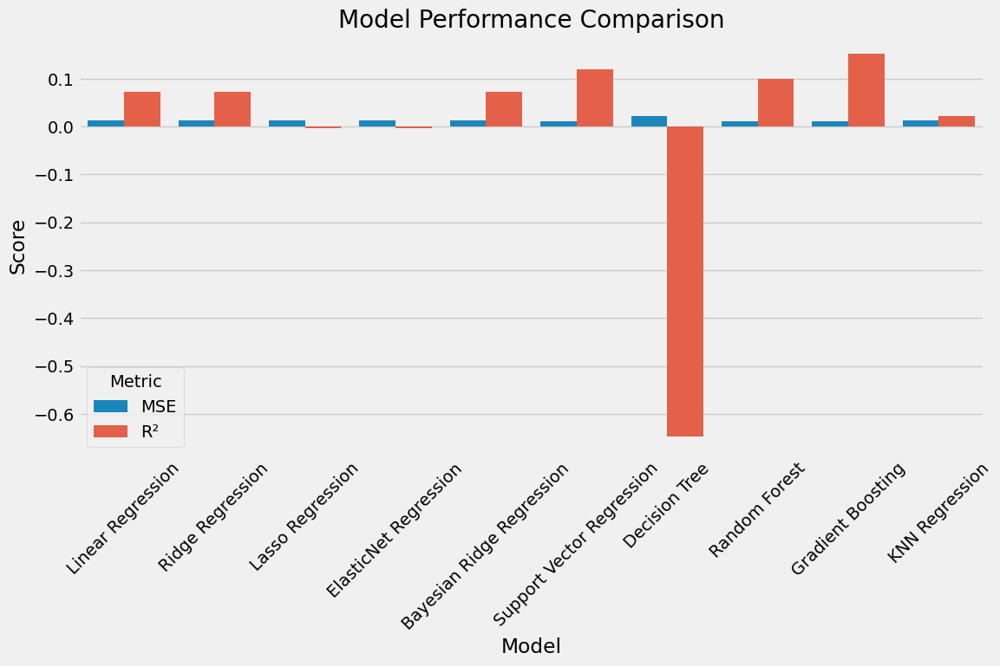

In [247]:

models = ['Linear Regression', 'Ridge Regression', 'Lasso Regression', 'ElasticNet Regression', 'Bayesian Ridge Regression', 'Support Vector Regression','Decision Tree','Random Forest','Gradient Boosting','KNN Regression']
mse = [0.012192,0.012192,0.013184,0.013184,0.012203,0.011565,0.022271,0.011783,0.011136,0.012794]
R_squre = [0.072688,0.072681,-0.002815,-0.002815,0.071865,0.119056,-0.647066,0.099464,0.151749,0.022419]
# Create a DataFrame
model_data =pd.DataFrame({
    'Model': models,
    'MSE' : mse,
    'R²': R_squre
    
})
# Melt the DataFrame to long-form for seaborn
data_melted = model_data.melt(id_vars='Model', var_name='Metric', value_name='Value')

# Plot the data
plt.figure(figsize=(12, 6))
sns.barplot(x='Model', y='Value', hue='Metric', data=data_melted)
plt.title('Model Performance Comparison')
plt.xticks(rotation=45)
plt.ylabel('Score')
plt.show()

In [248]:
#parameter tunning
# Import necessary libraries
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for tuning
param_grid = {
    'n_estimators': [100, 200, 300],         # Number of boosting stages (trees)
    'learning_rate': [0.01, 0.05, 0.1],      # Shrinks the contribution of each tree
    'max_depth': [3, 4, 5],                  # Maximum depth of each tree
    'subsample': [0.8, 1.0],                 # Fraction of samples to be used for fitting individual base learners
    'min_samples_split': [2, 5, 10]          # Minimum number of samples required to split an internal node
}

# Initialize the GradientBoostingRegressor
gbr = GradientBoostingRegressor(random_state=42)

# Set up the GridSearchCV
grid_search = GridSearchCV(estimator=gbr, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1, verbose=1)

# Fit the model
grid_search.fit(x_train, y_train)

# Get the best parameters and the best score
best_params = grid_search.best_params_
best_score = -grid_search.best_score_  # Negating because MSE is negative in GridSearchCV scoring

# Print the results
print("Best Parameters:", best_params)
print("Best Mean Squared Error (MSE):", best_score)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test)

# Calculate test MSE and R²
test_mse = mean_squared_error(y_test, y_pred)
test_r2 = r2_score(y_test, y_pred)

print("Test MSE:", test_mse)
print("Test R²:", test_r2)


Fitting 5 folds for each of 162 candidates, totalling 810 fits
Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 300, 'subsample': 0.8}
Best Mean Squared Error (MSE): 0.010944629777680473
Test MSE: 0.010384370892983158
Test R²: 0.19208749921895585


In [249]:
#create model

model=  GradientBoostingRegressor()
model.fit(x,y)

GradientBoostingRegressor()

In [250]:
import pickle
with open("diversity index.pickle",'wb') as file:
    pickle.dump(model,file)